## THE NETWORK OF VOLTAIRE'S PHILOSOPHICAL DICTIONARY 
## Notebook 4: Graphs of co-occurrent dictionary terms and names
## By M.A. Boudourides, H. Bin Fahad, Y. Malla, & S. Silwal

In [1]:
import codecs,re, math, random, pickle, operator, string,urllib2, pandas as pd,numpy as np,itertools as it
from collections import Counter

import nltk
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.tag import pos_tag
from textblob import TextBlob

import networkx as nx
from networkx import NetworkXNoPath
from networkx.algorithms import bipartite
from networkx.drawing.nx_agraph import graphviz_layout
import pygraphviz
import matplotlib.pyplot as plt
import matplotlib as mpl
from wordcloud import WordCloud

import community

# Change the following two lines:
# import os
# os.chdir("/Users/[User Name]/Desktop/")

import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=RuntimeWarning) 

In [2]:
filename = 'Voltaire_PhilosophicalDictionary_mod1.txt' # Insert in quotes the name of your txt file, e.g. "PeterPan.txt"
titlename = "Voltaire's Philosophical Dictionary"   # Insert in quotes the name of the novel (or book), e.g., "Peter Pan"

f = codecs.open(filename, "r", encoding="utf-8").readlines()

num_lines = 0
num_words = 0
num_chars = 0
for line in f:
    words = line.split()
    num_lines += 1
    num_words += len(words)
    num_chars += len(line)
print "%s has number of words = %i (and number of characters/symbols = %i)" %(titlename,num_words,num_chars)

Voltaire's Philosophical Dictionary has number of words = 88628 (and number of characters/symbols = 515505)


In [3]:
stext="\n".join(f).split("##########################################################")
print len(stext)
# stext[6]

docsd={}
for i in range(len(stext)):
    sb=stext[i].split("\r\n\n\r\n\n")
    se=[w.replace("\r\n\n"," ") for w in sb[1:]]
    se=", ".join(se).strip()
    docsd[sb[0].strip()] = se
# for k,v in docsd.items():
#     print k,v
#     print
docs=docsd.values()
len(docs)

99


99

In [4]:
text=", ".join(f).encode('ascii','ignore').replace('\n',' ')
print len(text) #, type(text)
# text

535765


In [5]:
# #1
# with open('names.pickle', 'rb') as handle:
#     c = pickle.load(handle)
# with open('terms.pkl', 'rb') as f:
#      terms = pickle.load(f)
# for term in terms:
#     c[term]=3

In [6]:
# #2
# pnames=[k for k,v in c.items() if v==1]
# lnames=[k for k,v in c.items() if v==2]
# nterms=[k for k,v in c.items() if v==3]
# print len(pnames), len(lnames),len(nterms)
# allnames=pnames+lnames+nterms
# print len(allnames)

In [7]:
# #3
# rem=["Chu","Eve","Charles","John","AmyotSt. Andre","FloraFontenelle",
#     "AntonyPierre AoudriKing Aout","Louis XIVLouis XII","AphroditeApis",
#     "Leo X.Leontius","Ardassan OugliArgonauts","Michael AngeloAnitus","Lemnos"]
# add=["Chu ","Eve,","Charles I.","Charles II.","Charles V.","Charles VII.",
#     "Charles VIII.","Charles IX.","Charles XII.","Amyot","St. Andre",
#     "Flora","Fontenelle","Antony","Pierre Aoudri","King Aout","Louis XIV",
#      "Louis XII","Aphrodite","Apis","Leo X.","Leontius","Ardassan Ougli",
#      "Argonauts","Anitus","Michael Angelo"]
# pnames=[w for w in pnames if w not in rem]
# pnames=pnames+add
# for i in sorted(pnames):
#     print i

In [8]:
# #4
# reml=["DouroLorraine","North Norway"]
# addl=["Lemnos","Douro","Lorraine","Norway"]
# lnames=[w for w in lnames if w not in reml]
# lnames=lnames+addl
# for i in sorted(lnames):
#     print i

In [5]:
# with open('pnames.pkl', 'wb') as f:
#     pickle.dump(pnames, f)
# with open('lnames.pkl', 'wb') as f:
#     pickle.dump(lnames, f)
# with open('nterms.pkl', 'wb') as f:
#     pickle.dump(nterms, f)
with open('pnames.pkl', 'rb') as f:
    pnames = pickle.load(f)
with open('lnames.pkl', 'rb') as f:
    lnames = pickle.load(f)
with open('nterms.pkl', 'rb') as f:
    nterms = pickle.load(f)
allnames=pnames+lnames+nterms
print len(pnames),len(lnames),len(nterms) # 370 242 99
len(allnames) # 711

370 242 99


711

In [10]:
freq1=[]
for k in pnames:
    s=0
    for kk,v in docsd.items():
#         v=v.lower()
        s+=v.count(k)
    freq1.append(s)
trf1_df = pd.DataFrame(
    {'Character Name': pnames,
     'Frequency of Occurrences': freq1
    })
trf1_df=trf1_df[['Character Name','Frequency of Occurrences']]
trf1_df=trf1_df.sort_values(by ='Frequency of Occurrences',ascending=False)
trf1_df

,Character Name,Frequency of Occurrences
360,Louis XIV,26
229,Zarathustra,23
2,Caesar,22
89,Cromwell,22
307,Bayle,21
106,Newton,17
61,Dondindac,17
48,Logomacos,17
38,Mohammed,17
47,Joan,16


In [11]:
# x = [tuple(i) for i in trf1_df.values]
# for y in x:
#     print y[0],y[1]

In [12]:
# x = [tuple(i) for i in trf1_df.values]
# t=[]
# for (i,j) in x:
#     for k in range(j):
# #         print i.replace(" ","_").replace("-","_")
#         t.append(i.replace(" ","_").replace("-","_"))
# for i in sorted(set(t)):
#     print i

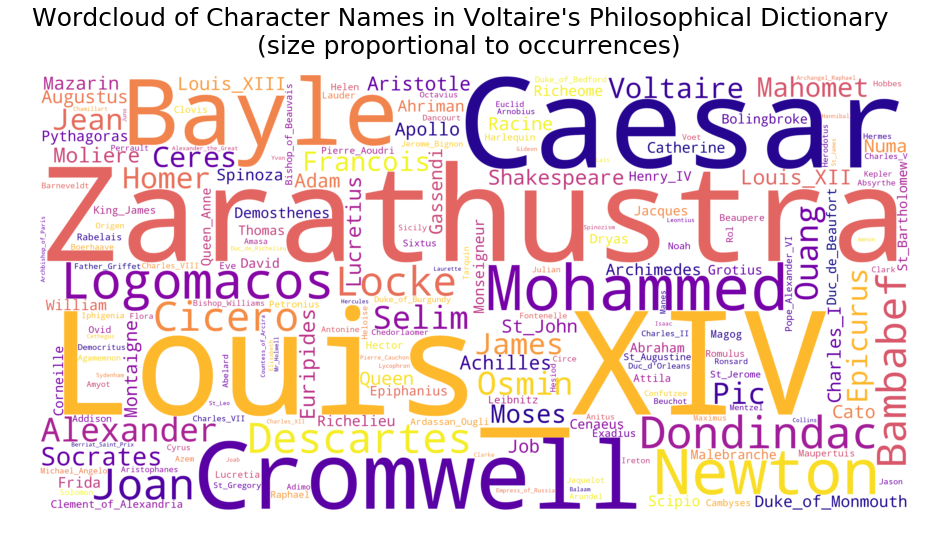

In [13]:
x = [tuple(i) for i in trf1_df.values]
t=[]
for (i,j) in x:
    for k in range(j):
#         print i.replace(" ","_").replace("-","_")
        t.append(i.replace(" ","_").replace("-","_").replace(".",""))
ttd=' '.join(t)
wordcloud = WordCloud(collocations=False,background_color="white",colormap="plasma",width=4000,height=2000).generate(ttd)
fig = plt.figure(figsize=(13,13))
default_colors = wordcloud.to_array()
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
ss="Wordcloud of Character Names in Voltaire's Philosophical Dictionary \n (size proportional to occurrences)"
plt.suptitle(ss,fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 1.35]) 
plt.show()

In [14]:
freq2=[]
for k in lnames:
    s=0
    for kk,v in docsd.items():
#         v=v.lower()
        s+=v.count(k)
    freq2.append(s)
trf2_df = pd.DataFrame(
    {'Location Name': lnames,
     'Frequency of Occurrences': freq2
    })
trf2_df=trf2_df[['Location Name','Frequency of Occurrences']]
trf2_df=trf2_df.sort_values(by ='Frequency of Occurrences',ascending=False)
trf2_df

,Location Name,Frequency of Occurrences
121,France,45
52,India,39
24,Europe,34
95,Egypt,32
166,Rome,31
179,England,30
101,Paris,20
69,Asia,19
58,Jupiter,19
57,China,16


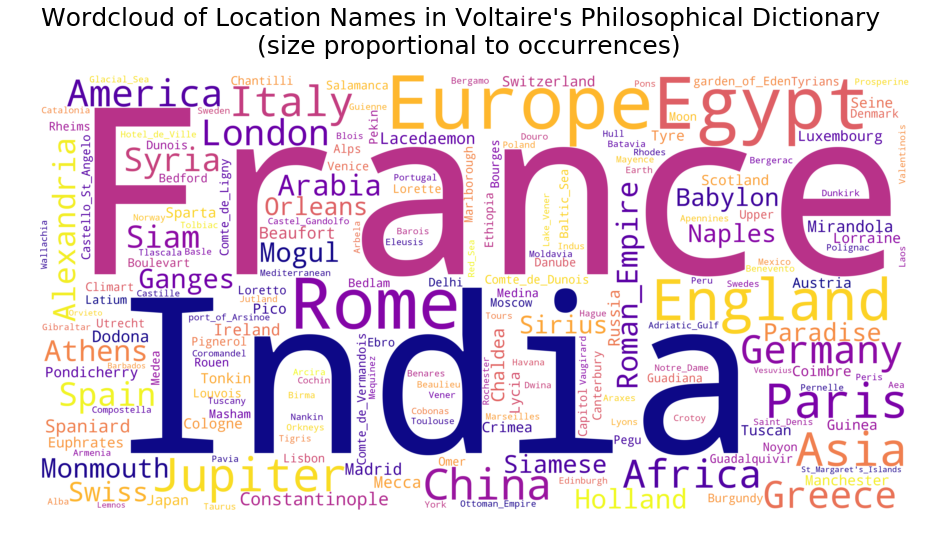

In [15]:
x = [tuple(i) for i in trf2_df.values]
t=[]
for (i,j) in x:
    for k in range(j):
#         print i.replace(" ","_").replace("-","_")
        t.append(i.replace(" ","_").replace("-","_").replace(".",""))
ttd=' '.join(t)
wordcloud = WordCloud(collocations=False,background_color="white",colormap="plasma",width=4000,height=2000).generate(ttd)
fig = plt.figure(figsize=(13,13))
default_colors = wordcloud.to_array()
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
ss="Wordcloud of Location Names in Voltaire's Philosophical Dictionary \n (size proportional to occurrences)"
plt.suptitle(ss,fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 1.35]) 
plt.show()

In [16]:
freq3=[]
for k in nterms:
    s=0
    for kk,v in docsd.items():
        v=v.lower()
        s+=v.count(k)
        s+=kk.count(k)
    freq3.append(s)
trf3_df = pd.DataFrame(
    {'Term': nterms,
     'Frequency of Occurrences': freq3
    })
trf3_df=trf3_df[['Term','Frequency of Occurrences']]
trf3_df=trf3_df.sort_values(by ='Frequency of Occurrences',ascending=False)
trf3_df

,Term,Frequency of Occurrences
39,art,360
30,god,225
57,nature,151
14,soul,150
37,reason,133
21,law,132
50,why,105
17,necessary,93
82,power,91
94,book,91


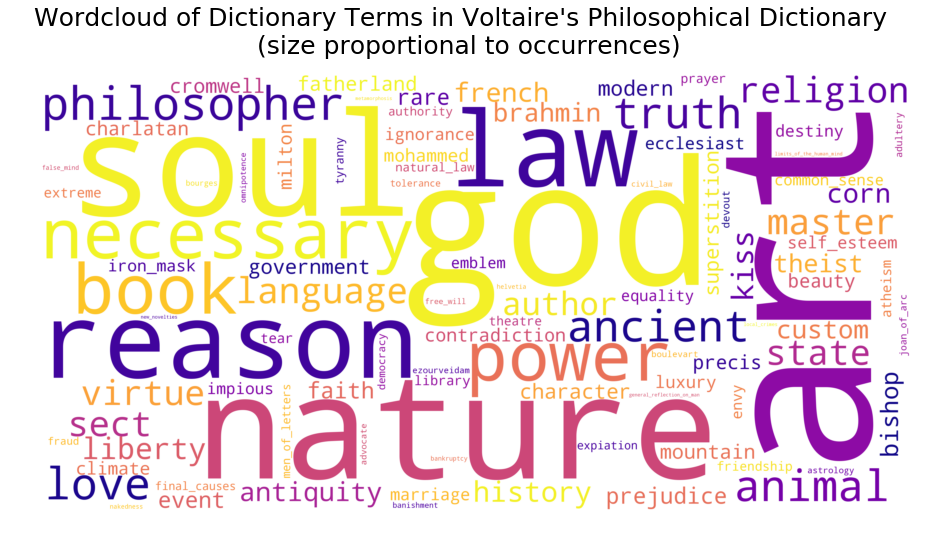

In [17]:
x = [tuple(i) for i in trf3_df.values]
t=[]
for (i,j) in x:
    for k in range(j):
#         print i.replace(" ","_").replace("-","_")
        t.append(i.replace(" ","_").replace("-","_").replace(".",""))
ttd=' '.join(t)
wordcloud = WordCloud(collocations=False,background_color="white",colormap="plasma",width=4000,height=2000).generate(ttd)
fig = plt.figure(figsize=(13,13))
default_colors = wordcloud.to_array()
plt.imshow(default_colors, interpolation="bilinear")
plt.axis("off")
ss="Wordcloud of Dictionary Terms in Voltaire's Philosophical Dictionary \n (size proportional to occurrences)"
plt.suptitle(ss,fontsize=25)
plt.tight_layout(rect=[0, 0, 1, 1.35]) 
plt.show()

## 1. The Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items

In [18]:
# medges=[]
# for k,v in docsd.items():
#     for j in it.combinations(allnames, 2):
#         if j[0] in v and j[1] in v:
#             medges.append((j[0],j[1],k))
# print len(medges),len(set(medges))
# medges

In [6]:
# with open('medges.pkl', 'wb') as f:
#     pickle.dump(medges, f)
with open('medges.pkl', 'rb') as f:
    medges = pickle.load(f)
print len(medges),len(set(medges))
medges

39269 39269


[('Collins', 'Clark', u'liberty'),
 ('Collins', 'Locke', u'liberty'),
 ('Collins', 'Mazarin', u'liberty'),
 ('Collins', 'France', u'liberty'),
 ('Collins', 'London', u'liberty'),
 ('Collins', 'love', u'liberty'),
 ('Collins', 'soul', u'liberty'),
 ('Collins', 'reason', u'liberty'),
 ('Collins', 'liberty', u'liberty'),
 ('Collins', 'state', u'liberty'),
 ('Collins', 'philosopher', u'liberty'),
 ('Collins', 'power', u'liberty'),
 ('Collins', 'book', u'liberty'),
 ('Clark', 'Locke', u'liberty'),
 ('Clark', 'Mazarin', u'liberty'),
 ('Clark', 'France', u'liberty'),
 ('Clark', 'London', u'liberty'),
 ('Clark', 'love', u'liberty'),
 ('Clark', 'soul', u'liberty'),
 ('Clark', 'reason', u'liberty'),
 ('Clark', 'liberty', u'liberty'),
 ('Clark', 'state', u'liberty'),
 ('Clark', 'philosopher', u'liberty'),
 ('Clark', 'power', u'liberty'),
 ('Clark', 'book', u'liberty'),
 ('Locke', 'Mazarin', u'liberty'),
 ('Locke', 'France', u'liberty'),
 ('Locke', 'London', u'liberty'),
 ('Locke', 'love', u'liber

In [7]:
G = nx.MultiGraph()
G.add_edges_from(medges)
weight={(x,y):v for (x, y), v in Counter(G.edges()).items()}
w_edges=[(x,y,z) for (x,y),z in weight.items()]
Gw = nx.Graph()
Gw.add_weighted_edges_from(w_edges)
# Gw.remove_node("cours")
print len(Gw.nodes()), len(Gw.edges())

# nodeterms=[n for n in Gw.nodes() if n in nterms]
# nodenames=[n for n in Gw.nodes() if n in pnames]
# nodelocs=[n for n in Gw.nodes() if n in lnames]

nodeterms=[n for n in Gw.nodes() if n in nterms]
nodenames=[n for n in Gw.nodes() if n in pnames]
nodelocs=[n for n in Gw.nodes() if n in lnames]
print "The nodes of Gw are:"
print len(nodeterms),"terms"
print len(nodenames),"names"
print len(nodelocs),"locations"

print "The density of Gw is %.3f" %nx.density(Gw)
if nx.is_connected(Gw)==True:
    print "Gw is a connected graph"
else:
    print "Gw is a disconnected graph and it has",nx.number_connected_components(Gw),"connected components"    

# giant = max(nx.connected_component_subgraphs(Gw), key=len)
# Gwl=Gw.subgraph(giant)
# print "The largest connected component of Gw is a weighted graph with %i nodes and %i edges" %(len(Gwl.nodes()),len(Gwl.edges()))
# print "The density of the largest connected component of Gw is %.3f" %nx.density(Gwl)

# # lccmedges=[]
# # for e in medges:
# #     if e[0] in giant and e[1] in giant:
# #         lccmedges.append((e[0],e[1]))
# # NN=len(Gwlcc.nodes())
# # SS=len(lccmedges)

696 25561
The nodes of Gw are:
84 terms
370 names
242 locations
The density of Gw is 0.106
Gw is a connected graph


In [8]:
def g_diagnostics(G,st):
    
    print "The %s graph has %i nodes and %i edges" %(st,len(G.nodes()), len(G.edges()))
#     print

    if G.is_multigraph()==True:
        print "The %s graph is a multigraph" %st
    else:
        print "The %s graph is a simple graph" %st
    if nx.is_weighted(G)==True:
        print "The %s graph is a weighted graph" %st
    else:
        print "The %s graph is an unweighted graph" %st
    if G.is_directed()==True:
        print "The %s graph is a directed graph" %st
    else:
        print "The %s graph is an undirected graph" %st    
    if nx.is_bipartite(G)==True:
        print "The %s graph is a bipartite graph" %st
    else:
        print "The %s graph is not a bipartite graph" %st    
    if nx.is_tree(G)==True:
        print "The %s graph is a tree" %st
    else:
        print "The %s graph is not a tree" %st    
    if G.is_directed()==False:
        if nx.is_connected(G)==True:
            print "The %s graph is a connected graph" %st
        else:
            print "The %s graph is a disconnected graph and it has %i connected components" %(st,nx.number_connected_components(G))   
    else:
        if nx.is_strongly_connected(G)==True:
            print "The %s graph is a strongly connected graph" %st
        else:
            print "The %s graph is not strongly connected and it has %i strongly connected components" %(st,nx.number_strongly_connected_components(G))
        if nx.is_weakly_connected(G)==True:
            print "The %s graph is a weakly connected graph" %st
        else:
            print "The %s graph is not weakly connected and it has %i weakly connected components" %(st,nx.number_weakly_connected_components(G))    
    if len(list(nx.isolates(G)))>0:
        print "The %s graph has isolates" %(st,len(list(nx.isolates(G))))
    else:
        print "The %s graph has no isolates" %st
    print "The density of the %s graph is %.3f" %(st,nx.density(G))   
    print "The transitivity of the %s graph is %.3f" %(st,nx.transitivity(G)) 
    print "The reciprocity of the %s graph is %.3f" %(st,nx.reciprocity(G))

def g_diameter(G,st):    
    try:
        diameter=nx.diameter(G)
        print "The diameter of the largest strongly connected component of %s graph is %i" %(st,diameter)
    except Exception as e: 
        print(e)

In [9]:
st=titlename
g_diagnostics(Gw,st)

The Voltaire's Philosophical Dictionary graph has 696 nodes and 25561 edges
The Voltaire's Philosophical Dictionary graph is a simple graph
The Voltaire's Philosophical Dictionary graph is a weighted graph
The Voltaire's Philosophical Dictionary graph is an undirected graph
The Voltaire's Philosophical Dictionary graph is not a bipartite graph
The Voltaire's Philosophical Dictionary graph is not a tree
The Voltaire's Philosophical Dictionary graph is a connected graph
The Voltaire's Philosophical Dictionary graph has no isolates
The density of the Voltaire's Philosophical Dictionary graph is 0.106
The transitivity of the Voltaire's Philosophical Dictionary graph is 0.395
The reciprocity of the Voltaire's Philosophical Dictionary graph is 0.000


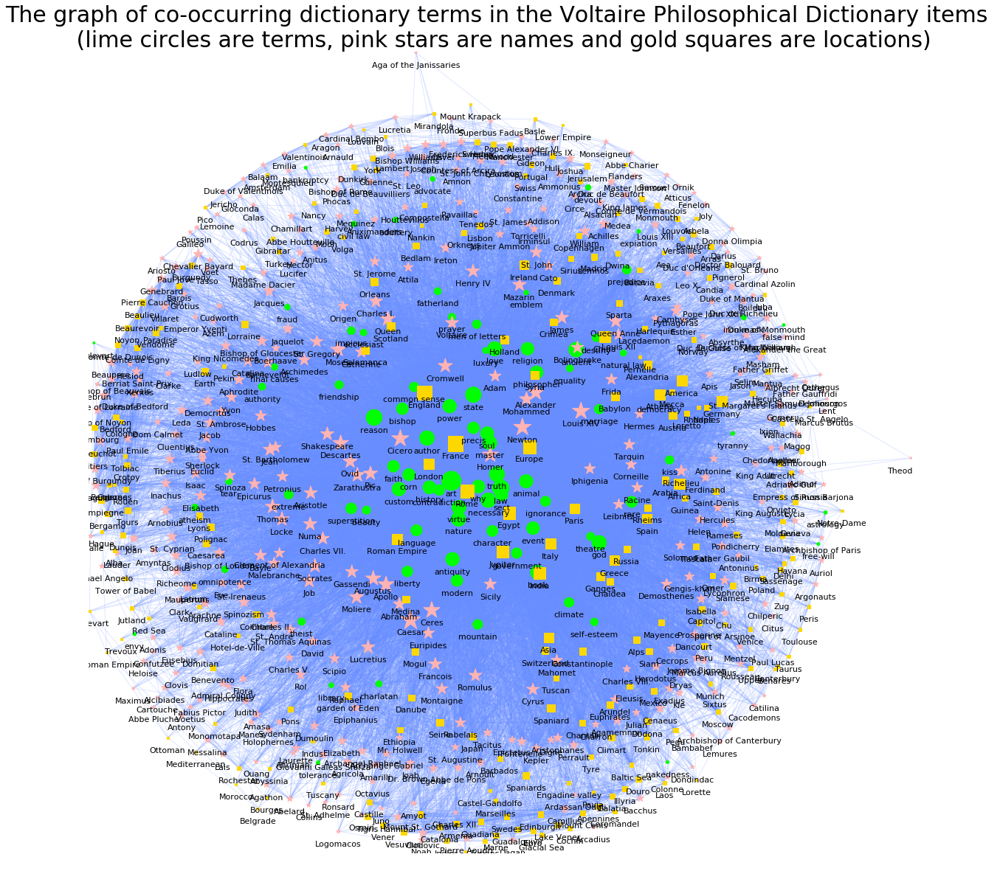

In [21]:
edge_width=[Gw[u][v]['weight'] for u,v in Gw.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

nsi1=[Gw.degree(n) for n in Gw.nodes() if n in nodeterms]
nsi2=[3*Gw.degree(n) for n in Gw.nodes() if n in nodenames]
nsi3=[Gw.degree(n) for n in Gw.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Gw) 

# print pos['Pic']
pos['Pic'] = (162.74, 136.11)
pos['Ovid'] = (156.52, 139.83) #(156.52, 145.83)
pos['reason'] = (163.83, 153.56) #(193.83, 153.56)
pos['Chu'] = (185.33, 161.76) #(190.33, 161.76)
pos['Achilles'] = (234.07, 213.93) #(228.07, 213.93)
pos['Ireland'] = (209.69, 201.23) #(205.69, 201.23)
pos['Cato'] = (217.17, 200.88) #(219.17, 200.88)
pos['Madrid']= (231, 203.8) #(229.76, 203.8)
pos['Pythagoras']=(256.07, 186.85) #(252.07, 184.85)
pos['Queen'] = (168.04, 184.41) #(161.04, 169.41)
pos['America']=(257.74, 165) #(257.74, 157.56)
pos['Germany'] = (270, 158.62) #(264.05, 148.62)
pos['prejudice'] = (240.97, 199.66) #(240.97, 185.66)
pos['religion'] = (210.7, 175) #(210.7, 168.34)
pos['kiss'] = (254.06, 140.3) #(259.06, 140.3)
pos['ecclesiast'] = (160.62, 180.08) #(157.62, 184.08)
pos['sect']=(202.83, 129.38) #(202.83, 137.38)
pos['truth']=(201.36, 135.87) #(201.36, 139.87)
pos['master'] =(199.17, 145.65) #(196.17, 145.65)
pos['contradiction']= (183.74, 130.93) #(187.74, 139.93)
pos['book'] = (213.75, 105.24) #(213.75, 130.24)
pos['god'] = (232.57, 114.49) #(232.57, 139.49)
pos['Athens']=(251.09, 160.73) #(247.09, 166.73)
pos['China']= (234.26, 178.79) #(234.26, 175.79)
pos['animal'] = (210.27, 133.64)  #(210.27, 153.64)
pos['Spain'] = (247.14, 121.99) #(247.14, 111.99)
pos['Africa'] = (257.09, 132.85) #(257.09, 127.85)
pos['Alexandria'] = (247.32, 170.06) #(242.32, 170.06)
pos['Paris'] = (225.01, 125.08) #(225.01, 132.08)
pos['ancient'] = (225.54, 174.74) #(225.54, 144.74)
pos['philosopher'] = (213.5, 167.66) #(213.5, 164.66)
pos['love'] = (200.67, 175.0) #(200.67, 157.0)
pos['London'] = (180.51, 139.08)#(180.51, 136.08)
pos['rare'] = (242.49, 127.23) #(239.29, 127.23)
pos['state'] = (194.14, 160.65) #(194.14, 158.65)
 # node_color={}
# for n in Gw.nodes():
#     if n in nodeterms:
#         node_color[n]="lime"
#     if n in nodenames:
#         node_color[n]="#ffb3b3"
#     if n in nodelocs:
#         node_color[n]="#gold"
node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
nodes1 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
nodes2 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
nodes3 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Gw, pos, edge_color=edge_color,width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gw.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -4 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gw, yoffset,labels=labels_no,font_size=11);
sst="The graph of co-occurring dictionary terms in the Voltaire Philosophical Dictionary items \n (lime circles are terms, pink stars are names and gold squares are locations)"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.) 

In [22]:
nodeterms=[n for n in Gw.nodes() if n in nterms]
nodenames=[n for n in Gw.nodes() if n in pnames]
nodelocs=[n for n in Gw.nodes() if n in lnames]

pos0=nx.circular_layout(nx.cycle_graph(3)) 

G1=Gw.subgraph(nodeterms)
sh1=[]
sh2=[]
sh3=[]
for i,n in enumerate(G1.nodes()):
    if i in range(15):
        sh1.append(n)
    elif i in range(15,47):
        sh2.append(n)
    else:
        sh3.append(n)
shells1=[sh1,sh2,sh3]
pos1=nx.shell_layout(G1, shells1) 

G2=Gw.subgraph(nodenames)
sh11=[]
sh22=[]
sh33=[]
sh44=[]
sh55=[]
sh66=[]
sh77=[]
for i,n in enumerate(G2.nodes()):
    if i in range(15):
        sh11.append(n)
    elif i in range(15,45):
        sh22.append(n)
    elif i in range(45,90):
        sh33.append(n)
    elif i in range(90,150):
        sh44.append(n)
    elif i in range(150,220):
        sh55.append(n)
    elif i in range(220,290):
        sh66.append(n)
    else:
        sh77.append(n)
shells2=[sh11,sh22,sh33,sh44,sh55,sh66,sh77]
pos2=nx.shell_layout(G2, shells2) 

G3=Gw.subgraph(nodelocs)
sh111=[]
sh222=[]
sh333=[]
sh444=[]
sh555=[]
sh666=[]
for i,n in enumerate(G3.nodes()):
    if i in range(15):
        sh111.append(n)
    elif i in range(15,39):
        sh222.append(n)
    elif i in range(39,77):
        sh333.append(n)
    elif i in range(77,125):
        sh444.append(n)
    elif i in range(125,176):
        sh555.append(n)
    else:
        sh666.append(n)
shells3=[sh111,sh222,sh333,sh444,sh555,sh666]
pos3=nx.shell_layout(G3, shells3) 

def re_pos(pos,centre,radius):
    plist=[list(v) for v in pos.values()]
    nplist=[v for v in pos.values()]
    x = [p[0] for p in plist]
    y = [p[1] for p in plist]
    centroid = (sum(x) / float(len(plist)), sum(y) / float(len(plist)))
    ncentroid=np.array(centroid)
    rad=max([np.linalg.norm(nplist[i]-ncentroid) for i in range(len(nplist))])
    rpos={}
    for k,v in pos.items():
        rpos[k]=[(v[0]+centre[0])/float(radius),(v[1]+centre[1])/float(radius)]
    return rpos

centers=pos0.values()
centerm=[]
for i in range(len(centers)):
    t=[]
    for j in centers[i]:
        t.append(1.35*j)  #3* 2.7*
    centerm.append(np.array(t))
centers=centerm

# radius=1. #1.5
pos1=re_pos(pos1,centers[0],0.008) #radius)  
pos2=re_pos(pos2,centers[1],0.004) #radius)    
pos3=re_pos(pos3,centers[2],0.004) #radius) 

pos1['god']=[168.7499974904832, 95]                           #90[168.7499974904832, 83.3333391696215]
pos1['authority']=[164.39464390277863, 50]                    #[164.39464390277863, 41.438418999314344]
pos1['bankruptcy']=[195.00753194093704, 90]                   #[185.00753194093704, 81.7321125417948]
pos1['iron mask']= [190, 76.98996700346473]                   #[200.64028799533844, 76.98996700346473]
pos1['self-esteem']=[168.75000212683892, -96]                 #[168.75000212683892, -83.33333246409889]
pos1['prejudice']= [174.0551272407174, -130]                  #[174.0551272407174, -124.88736622035499]  
pos1['marriage']= [145, -90]                                  #[152.49246805906296, -81.7321058362722]
pos1['astrology']= [205, -30.96436187624928]                  #[196.6304451227188, -30.96436187624928]
pos1['event']= [164.39465088769794, -48]                      #[164.39465088769794, -41.438412293791735]
pos1['contradiction']= [128, -119.52083222568031]             #[132.14714154601097, -119.52083222568031]
pos1['expiation'] = [125, -84]                                #[136.85970082879066, -76.98996029794212]
pos1['government']= [145, 90]                                 #[152.4924736469984, 81.7321125417948]
pos1['theist']= [115, 72.28914375603202]                      #[122.45248332619668, 69.28914375603202]
pos1['democracy']= [215.04752039909363, 73]                   #[215.04752039909363, 69.28913630545142]
pos1['omnipotence']= [245, -106.44114427268501]               #[234.2884063720703, -106.44114427268501]


pos3['Hull']= [-145, -340]                                         #[-155.8742623776195, -331.91093943798126]
pos3['Prosperine'] = [-200.70659909397338, -505]                   #[-200.70659909397338, -498.15138198220313]
pos3['Burgundy']= [-173.1053309515116, -240]                       #[-168.74998255344354, -125.61691321217599]
pos3['Monomotapa']= [-249.243797548115, -318]                      #[-249.243797548115, -313.85184220754684]
pos3['Castello St. Angelo']= [-179.07239757478212, -425]           #[-179.07239757478212, -416.85664422595084]
pos3['Mount Krapack']= [-168.74998255344354, -115]                 #[-168.74998255344354, -125.61691321217599]
pos3['Orleans']= [-108, -446.26349724614204]                       #[-104.96936906129098, -446.26349724614204]
pos3['Taurus']= [-133.1712173297999, -545]                         #[-175.1656055450437, -84.04906607949319]
pos3['Comte de Vermandois']= [-180.64543958753322, -30]            #[-180.64543958753322, -42.56675161206308]
pos3['Comte de Dunois']=[-105, -535.2364829906185]                 #[-109.8102385178206, -535.2364829906185]
pos3['Guadalquivir']  =  [-168.7499732807313, -465]                #[-168.7499732807313, -458.95025647961677]
pos3['Valentinois']=[-168.74997781394987, -195]                    #[-168.74997781394987, -208.9502490290362]
pos3['Nankin']= [-258, -147.94602013909403]                        #[-252.083318121731, -147.94602013909403]
pos3[ 'Medina']=  [-179.07239012420152, -155]                      #[-179.07239012420152, -167.71052546584193]
pos3['Mecca']=[-158.4275539964435, -160]                           #[-158.4275539964435, -167.71052546584193]
pos3["St. Margaret's Islands"]=[-199.43565856665347, -165]         #[-199.43565856665347, -171.10854901158396]
# pos3['Mediterranean']=[-199.43565856665347, -162]                #[-199.43565856665347, -171.10854901158396]
pos3['Roman Empire']=[-160, -40]                                   #[-156.85449987649892, -42.56675161206308]


pos2['St. Cyprian']= [-178, 333] #[-172.48318768106424, 327.80222065531785]
pos2['Charles V.']= [-178, 247] #[-172.4831816274675, 256.76493562542976]
pos2['Socrates']= [-157.71369989961408, 253] #[-157.71369989961408, 258.31727526866973]
pos2['Chamillart']=[-157, 372]#[-161.28370985388779, 363.32086317026193]
pos2['Hannibal']=[-102, 298]#[-97.32145052403234, 292.2835786370792]
pos2['Duke of Valentinois']=[-98.88233970850729, 285]#[-98.88233970850729, 277.4327372365552]
pos2['Arcadius']=[-170, 210]#[-176.21633578091883, 221.24629311048565]
pos2['Abbe Yvon']=[-161.28371404483937, 218]#[-161.28371404483937, 221.24629311048565]
pos2['Bishop of Beauvais']=[-234.003275446594, 265]#[-234.003275446594, 263.23095366143764]
pos2['Sicily']=[-182, 370]#[-176.2163478881123, 363.32086317026193]
pos2['Juno']=[-165.0107927154752, 410]#[-165.0107927154752, 399.3611692615705]
pos2['Lent']=[-179.9495078623297, 408]#[-179.9495078623297, 398.8395019599157]
pos2['Master Johnson']=[-150.14485809952043, 402] #[-150.14485809952043, 397.79869310342843]
pos2['Duke of Monmouth']=[-70.87015341967367, 339]#[-70.87015341967367, 335.86250461422975]
pos2['Fabius Pictor']=[-65.75770657509588, 255]#[-65.75770657509588, 262.7509872593838]
pos2['Chilperic']=[-70.87014596909307, 244]#[-70.87014596909307, 248.70466656767903]
pos2['Charles VIII.']=[-165.0108125060799, 177]#[-165.0108125060799, 185.20598701917706]
pos2['Cicero']=[-199, 208]#[-194.67023182660364, 188.32331739151059]
pos2['Father Gaubil']=[-273.5515533015134, 274]#[-273.5515533015134, 270.0073144563395]
pos2['Holophernes']=[-234.71375536173605, 205]#[-234.71375536173605, 207.85385958635388]
pos2['Dagan']=[-32.88479875773215, 332]#[-32.88479875773215, 336.4288679488855]
pos2['Auriol']=[-135, 144]#[-139.04838245362066, 152.5481923648077]
pos2['Maximus']=[-168.75002188108118, 144]#[-168.75002188108118, 149.426428897019]
pos2['Heloise']=[-189, 138]#[-183.68264455348276, 150.2090080805975]
pos2['Duke of Mantua']=[-204, 442]#[-198.4517013654115, 432.0189490147787]
pos2['Archangel Raphael']=[-162, 448]#[-168.75002982911985, 435.1407273837286]
pos2['Anitus']=[-125, 439]#[-139.04835637658857, 432.0189639159399]
pos2['Amasa']=[3.3862071111795955, 335]#[3.3862071111795955, 339.7901564069944]
pos2['Villaret']=[9.102530963718658, 280]#[9.102530963718658, 276.27657942258895]
pos2['Theodosius']=[-7.862724177539581, 210]#[-7.862724177539581, 214.8043348618704]
pos2['Clodius']=[-144.77978814393305, 107]#[-144.77978814393305, 115.32826564991055]
pos2['Mr. Holwell']=[-176.7616027966144, 98]#[-176.7616027966144, 113.89195762359677]
pos2['King Aout']=[-192.7202602848413, 106]#[-192.7202602848413, 115.32826564991055]
pos2['Father Griffet']=[-340.8862574025991, 240]#[-340.8862574025991, 244.77700359904347]
pos2['Arundel']=[-347.32145797461294, 298]#[-347.32145797461294, 292.2835599822819]
pos2['Rameses']=[-346.60258125513815, 312]#[-346.60258125513815, 308.29058617138446]
pos2['Fontenelle']=[-344.451732747257, 328]#[-344.451732747257, 324.16873268568094],
pos2['Constantine']=[-192.7202491089704, 478]#[-192.7202491089704, 469.23889063083703]
pos2['Leda']=[-160.73845215141796, 476]#[-160.73845215141796, 470.6751986571508]
pos2['Kie']=[-123, 472]#[-129.01413422077917, 466.3778527804571]
pos2['Clarke']=[44.673048146068815, 276]#[44.673048146068815, 273.07518042409004]
pos2['St. John Chrysostom']=[15.203274972736603, 179]#[15.203274972736603, 182.37657688343106]
pos2['Pope John XXII']=[-178.3639181405308, 67]#[-178.3639181405308, 78.21364544117031]
pos2['Montaigne']=[-139.98573999851965, 73]#[-139.98573999851965, 79.9372031518179]
pos2['St. Ambrose']=[-216.4331002160909, 74]#[-216.4331002160909, 83.37046049320278]
pos2['Ronsard']=[-379.59208320826315, 324]#[-379.59208320826315, 330.5457628496843]
pos2['Chevalier Bayard']=[-159.13613773882412, 522]#[-159.13613773882412, 506.3535108395773]
pos2['Ovid']=[-203, 512]#[-197.5142935290935, 504.62995312892974]
pos2['Bolingbroke']=[-133, 510]#[-139.98575117439054, 504.62995312892974]
pos2['Apollo']=[-188.36478870362066, 549]#[-188.36478870362066, 541.5129049845892]
pos2['Alsacian']=[-149.13525413721823, 549]#[-149.13525413721823, 541.5129049845892]
pos2['St. Augustine']=[74.342452175915, 358]#[74.342452175915, 350.64492217981393]
pos2['Cluentius']=[54.00160718709207, 172]#[54.00160718709207, 178.78594837867794]
pos2['Geneva']=[-149.13524109870218, 37]#[-149.13524109870218, 43.05425129615842]
pos2['Cardinal Azolin']=[-188.36480360478186, 35]#[-188.36480360478186, 43.05425129615842]
pos2['Ferdinand']=[-207.8586554154756, 43]#[-207.8586554154756, 45.36150239193021]
pos2['Mahomet']=[-391.50165747851156, 174]#[-391.50165747851156, 178.78594092809735]
pos2['Bishop of Noyon']=[80.47931659966683, 268]#[80.47931659966683, 272.66883879684985]
pos2['Julian']=[-129.64140232652449, 543]#[-129.64140232652449, 539.2056687899786]
pos2['Michael Angelo']=[-207.8586367890241, 543]#[-207.8586367890241, 539.2056687899786]
pos2['Ariosto']=[81.24997485429024, 296]#[81.24997485429024, 292.2835770693529]
pos2['Cardinal Bembo']=[-342.1108199283483, 415]#[-342.1108199283483, 418.2375504800039]
pos2['St. Thomas Aquinas']=[-284.323878400028, 210]#[-284.323878400028, 208.3142384120184]
pos2['Moliere']=[-168.75003607355683, 538]#[-168.75003607355683, 542.2835781403738]

posAll=dict(pos1.items()+pos2.items()+pos3.items()+[(k,pos1[k]+pos2[k]+pos3[k]) for k in set(pos3)&set(pos2)&set(pos1)])

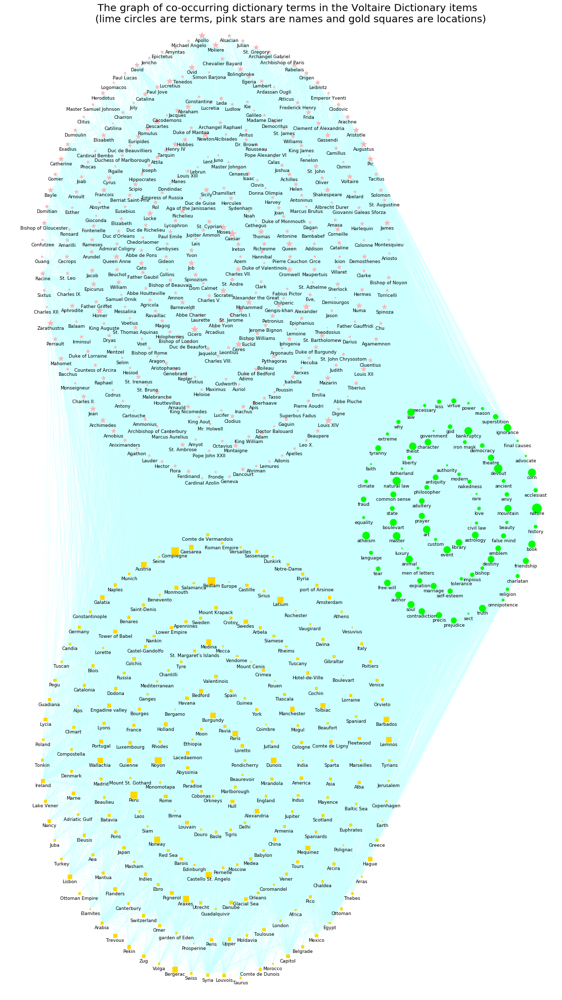

In [23]:
edge_width=[Gw[u][v]['weight'] for u,v in Gw.edges()]

plt.figure(figsize=(19,35))
node_border_color="r"
edge_color="#ccffff" #"#e6f9ff" #"#668cff" #"#668cff"

nsi1=[0.5*Gw.degree(n) for n in nodeterms] 
nsi2=[Gw.degree(n) for n in nodenames]
nsi3=[0.5*Gw.degree(n) for n in nodelocs]

nodeterms=[n for n in G1.nodes() if n in nodeterms]
nodenames=[n for n in G2.nodes() if n in nodenames]
nodelocs=[n for n in G3.nodes() if n in nodelocs]
nodes1 = nx.draw_networkx_nodes(G1, pos=pos1,nodelist=nodeterms,node_size=nsi1, node_color="lime")
nodes2 = nx.draw_networkx_nodes(G2, pos=pos2,nodelist=nodenames,node_size=nsi2, node_shape="*", node_color="#ffb3b3")
nodes3 = nx.draw_networkx_nodes(G3, pos=pos3,nodelist=nodelocs,node_size=nsi3, node_shape="s",node_color="gold")
# nx.draw_networkx_nodes(G5,pos=pos5,node_size=nsi5,nodelist=c5,node_color='cyan',alpha=1.);
# nx.draw_networkx_nodes(G6,pos=pos6,node_size=nsi6,nodelist=c6,node_color='magenta',alpha=1.);

nx.draw_networkx_edges(Gw, posAll, edge_color=edge_color,width=edge_width,alpha=0.4)
# nx.draw_networkx_labels(CGwi,posAll,labels=labels,font_size=13); 

# nx.draw_networkx_edges(G,pos=pos,edge_color='b',width=edgewidth,alpha=0.2);
# nx.draw_networkx_labels(G,pos=pos,labels=labels,font_size=25);

# plt.axis('off');
# yoffset = {}
# y_off = -0.16 # offset on the y axis
# for k, v in posAll.items():
#     yoffset[k] = (v[0], v[1]+y_off)
# nx.draw_networkx_labels(Gw, yoffset, font_size=16);
# sst="The %i communities of the graph of %s" %(kk,name)
# plt.title(sst,fontsize=20);
# plt.margins(x=0.3, y=0.1) 


# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gw.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -6 # offset on the y axis
for k, v in posAll.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gw, yoffset,labels=labels_no,font_size=9);
sst="The graph of co-occurring dictionary terms in the Voltaire Dictionary items \n (lime circles are terms, pink stars are names and gold squares are locations)"
plt.title(sst,fontsize=20);
plt.margins(x=0.04, y=0.01) 

## 2. The Subgraphs of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations 

In [24]:
# print len(nodeterms),"terms"
# print len(nodenames),"names"
# print len(nodelocs),"locations"
Gch=Gw.subgraph(nodenames)
print "The number of nodes (characters) of Gch is", len(Gch.nodes())
print "The number of edges (character co-occurrences) of Gch is", len(Gch.edges())
print "The density of Gch is %.3f" %nx.density(Gch)
if nx.is_connected(Gch)==True:
    print "Gch is a connected graph"
else:
    print "Gch is a disconnected graph and it has",nx.number_connected_components(Gch),"connected components"
giant = max(nx.connected_component_subgraphs(Gch), key=len)
Gchl=Gch.subgraph(giant)
print "The largest connected component of Gch is a weighted graph with %i nodes and %i edges" %(len(Gchl.nodes()),len(Gchl.edges()))
print "The density of the largest connected component of Gch is %.3f" %nx.density(Gchl)


The number of nodes (characters) of Gch is 370
The number of edges (character co-occurrences) of Gch is 3916
The density of Gch is 0.057
Gch is a disconnected graph and it has 11 connected components
The largest connected component of Gch is a weighted graph with 352 nodes and 3905 edges
The density of the largest connected component of Gch is 0.063


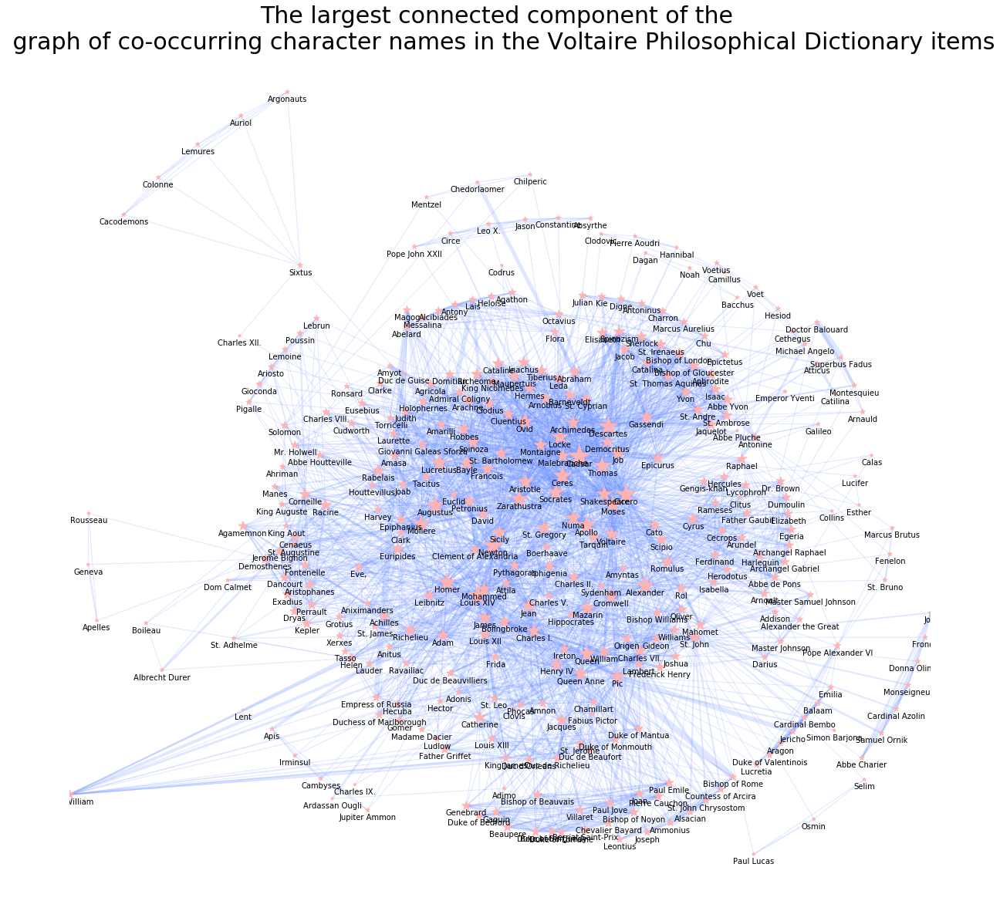

In [25]:
# edge_width=[Gchl[u][v]['weight'] for u,v in Gchl.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

# nsi1=[Gch.degree(n) for n in Gch.nodes() if n in nodeterms]
nsi2=[7*Gchl.degree(n) for n in Gchl.nodes() if n in nodenames]
# nsi3=[Gw.degree(n) for n in Gw.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Gchl) 

pos['Amyot']= (190.78, 280)  
pos['Ronsard']= (170, 269) #'Ronsard': (178.77, 263.53),
pos['Solomon']= (140, 248.01)  #'Solomon': (162.61, 248.01),
pos['Mr. Holwell']= (145, 237.48) #'Mr. Holwell': (167.41, 237.48),
pos['Abbe Houtteville']= (157, 232) #'Abbe Houtteville': (183.27, 237.14),
pos['Racine']= (159.82, 205.32) #'Racine': (152.82, 205.32),
pos['Agamemnon']= (120, 194.01) #'Agamemnon': (134.32, 194.01),
pos['Magog']= (199.02, 310) #'Magog': (176.57, 102.75),
pos['Duc de Beauvilliers']= (220, 115) #'Duc de Beauvilliers': (230.37, 104.41),
pos['Hector']= (215, 100) #'Hector': (224.66, 76.825),
pos['Louis XIII']= (240,80 ) #'Louis XIII': (226.91, 71.685),
pos['King William']= (36.36, 50) #'King William': (236.36, 70.562),
pos['Duke of Burgundy']= (268.9, 30) #'Duke of Burgundy': (268.9, 40.088),
pos['Bishop of Beauvais']= (262, 50) #'Bishop of Beauvais': (255.77, 39.348),
pos['Charles VIII.']= (160, 255.11) #'Charles VIII.': (175.39, 223.11),
pos['Torricelli']= (191.25, 252) #'Torricelli': (191.25, 254.49),
pos['Augustus']= (212.65, 205) #'Augustus': (212.65, 208.48),
pos['Euclid']= (221.66, 211) #'Euclid': (221.66, 208.87)
pos['Bayle']= (228, 227.7) #'Bayle': (226.15, 227.7),
pos['St. Bartholomew']= (244.54, 233) #'St. Bartholomew': (244.54, 240.18),
pos['Mazarin']= (286, 150) #'Mazarin': (282.83, 147.42),
pos['']= (199.02, 300.84)


node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
# nodes1 = nx.draw_networkx_nodes(Gch, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
nodenames=[n for n in Gchl.nodes() if n in nodenames]
nodes2 = nx.draw_networkx_nodes(Gchl, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
# nodes3 = nx.draw_networkx_nodes(Gw, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Gchl, pos, edge_color=edge_color,width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gchl.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -4 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gchl, yoffset,labels=labels_no,font_size=10);
sst="The largest connected component of the \n graph of co-occurring character names in the Voltaire Philosophical Dictionary items"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.05) 

In [26]:
Glo=Gw.subgraph(nodelocs)
print "The number of nodes (locations) of Glo is", len(Glo.nodes())
print "The number of edges (location co-occurrences) of Glo is", len(Glo.edges())
print "The density of Gch is %.3f" %nx.density(Glo)
if nx.is_connected(Glo)==True:
    print "Glo is a connected graph"
else:
    print "Glo is a disconnected graph and it has",nx.number_connected_components(Glo),"connected components"
giant = max(nx.connected_component_subgraphs(Glo), key=len)
Glol=Glo.subgraph(giant)
print "The largest connected component of Glo is a weighted graph with %i nodes and %i edges" %(len(Glol.nodes()),len(Glol.edges()))
print "The density of the largest connected component of Glo is %.3f" %nx.density(Glol)

The number of nodes (locations) of Glo is 242
The number of edges (location co-occurrences) of Glo is 2766
The density of Gch is 0.095
Glo is a disconnected graph and it has 5 connected components
The largest connected component of Glo is a weighted graph with 238 nodes and 2766 edges
The density of the largest connected component of Glo is 0.098


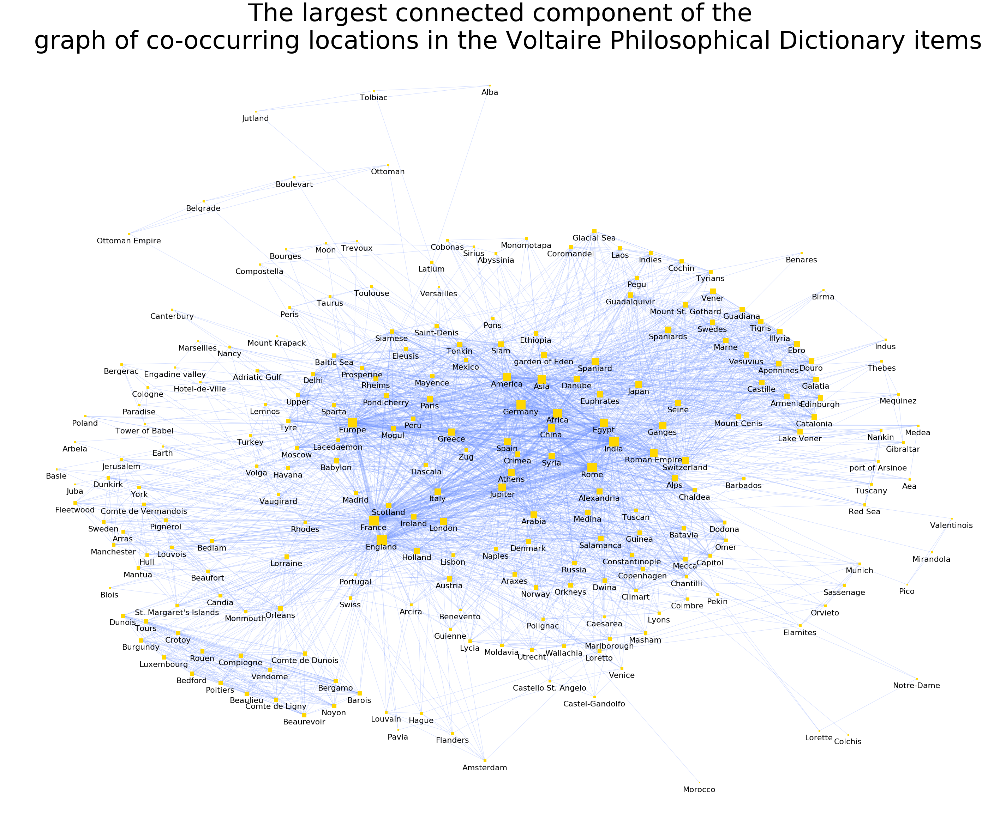

In [27]:
edge_width=[Glol[u][v]['weight'] for u,v in Glol.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

# nsi1=[Gch.degree(n) for n in Gch.nodes() if n in nodeterms]
# nsi2=[5*Gchl.degree(n) for n in Gchl.nodes() if n in nodenames]
nsi3=[6*Glol.degree(n) for n in Glol.nodes() if n in nodelocs]

figsize=(50,40)
pos=graphviz_layout(Glol) 

# pos["Africa"]   = (250, 220.27)     #(226.37, 220.27)
# pos["Greece"]   =(192.07, 215)   #(192.07, 200.42)
pos["Amsterdam"]=(202.82, 30)     #(202.82, 53.631)
pos['Europe']= (159.94, 215)      #(159.94, 207.26)
pos['Greece']= (192.07, 210)      #(192.07, 200.42)
pos["St. Margaret's Islands"]= (103.04, 115) #(103.04, 125.86)
pos['Paris']= (185, 227.98)       #(181.64, 227.98)
pos['America']= (210, 240)        #(224.28, 246.74)
pos['Flanders']= (192.35, 45)     #(192.35, 53.707)
pos['Saint-Denis']= (187.21, 268) #(187.21, 261.75)
pos[ 'Siamese']= (172.61, 265)    #(172.61, 260.6)
pos[ 'Siam']= (208, 258.14)    #(203.31, 258.14)
pos['Danube']= (232.58, 239) #(232.58, 227.27)
pos['Guienne']= (191.67, 102) #(191.67, 108.35)
pos['Guinea']= (252.95, 155)  #(252.95, 144.31)]
pos['Fleetwood']= (70, 171.14) #(78.899, 171.14)
pos['Mount Cenis']= (285, 218.49)   # (299.67, 218.49)]
pos['Guadalquivir']= (250, 285)  #(260.05, 280.51)]
pos['Vener']= (276.73, 287)   #(276.73, 281.19)]
pos['Monomotapa']= (216.29, 316)    #(216.29, 306.89)]
pos['Glacial Sea']= (238.28, 320)  #(238.28, 315)
pos['Bergerac']= (85, 246.9)       #(97.37, 246.9)]
pos['Castel-Gandolfo']= (238.35, 65)  #(238.35, 74.288)]
pos['Comte de Dunois']= (144.53, 88.663)  #(144.53, 78.663)]
pos['Beaurevoir']= (144.28, 55)  #(144.28, 61.048)
pos['Egypt']= (241.4, 215)   #(241.4, 211.03)]
pos['Arbela']= (70, 204.44)  #(65.068, 204.44)]
pos['Juba']= (70, 181.35)  #(62.352, 181.35)]
pos['Basle']= (64, 189.58) #(63.589, 189.58)']
pos['Bourges']= (138.26, 310)  #(138.26, 304.12)
pos['Cobonas']= (190.67, 315) #(190.67, 307.48)

node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
# nodes1 = nx.draw_networkx_nodes(Gch, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
nodelocs=[n for n in Glol.nodes() if n in nodelocs]
# nodes2 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
nodes3 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Glol, pos, edge_color=edge_color,width=edge_width,alpha=0.3)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Glol.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -4 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Glol, yoffset,labels=labels_no,font_size=22);
sst="The largest connected component of the \n graph of co-occurring locations in the Voltaire Philosophical Dictionary items"
plt.title(sst,fontsize=70);
plt.margins(x=0.05, y=0.05) 

In [28]:
Gte=Gw.subgraph(nodeterms)
print "The number of nodes (terms) of Gte is", len(Gte.nodes())
print "The number of edges (term co-occurrences) of Gte is", len(Gte.edges())
print "The density of Gte is %.3f" %nx.density(Gte)
if nx.is_connected(Gte)==True:
    print "Gte is a connected graph"
else:
    print "Gte is a disconnected graph and it has",nx.number_connected_components(Gte),"connected components"
# giant = max(nx.connected_component_subgraphs(Gte), key=len)
# Gtel=Gte.subgraph(giant)
# print "The largest connected component of Gte is a weighted graph with %i nodes and %i edges" %(len(Gtel.nodes()),len(Gtel.edges()))
# print "The density of the largest connected component of Gte is %.3f" %nx.density(Gtel)


The number of nodes (terms) of Gte is 84
The number of edges (term co-occurrences) of Gte is 1858
The density of Gte is 0.533
Gte is a connected graph


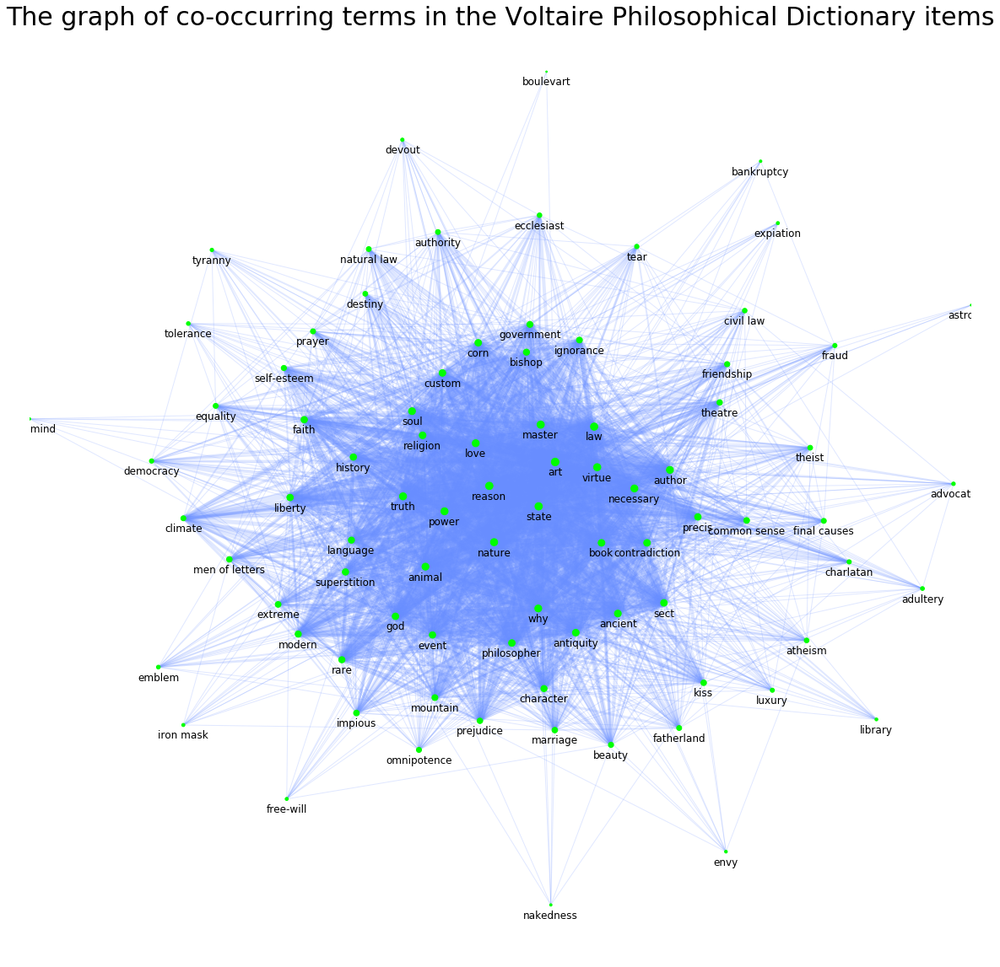

In [29]:
edge_width=[Gte[u][v]['weight'] for u,v in Gte.edges()]
# elabels = nx.get_edge_attributes(Gw,'weight')
# edge_width=[math.log(1+w) for w in edge_width]
# [3*w for w in edge_width] 

nsi1=[Gte.degree(n) for n in Gte.nodes() if n in nodeterms]
# nsi2=[5*Gchl.degree(n) for n in Gchl.nodes() if n in nodenames]
# nsi3=[3*Glol.degree(n) for n in Glol.nodes() if n in nodelocs]

figsize=(20,20)
pos=graphviz_layout(Gte) 

node_border_color="r"
edge_color="#668cff"
plt.figure(figsize=figsize);
nodeterms=[n for n in Gte.nodes() if n in nodeterms]
nodes1 = nx.draw_networkx_nodes(Gte, pos,nodelist=nodeterms, node_color="lime",node_size=nsi1)
# nodelocs=[n for n in Glol.nodes() if n in nodelocs]
# nodes2 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodenames, node_shape="*", node_color="#ffb3b3",node_size=nsi2)
# nodes3 = nx.draw_networkx_nodes(Glol, pos,nodelist=nodelocs, node_shape="s",node_color="gold",node_size=nsi3)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
# nodes1.set_edgecolor(node_border_color)
nx.draw_networkx_edges(Gte, pos, edge_color=edge_color,width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edge_labels(G,pos,edge_labels=elabels);
plt.axis('off');
labels_no={}
for n in Gte.nodes():
    labels_no[n]=str(n) #''
yoffset = {}
y_off = -3 # offset on the y axis
for k, v in pos.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Glol, yoffset,labels=labels_no,font_size=12);
sst="The graph of co-occurring terms in the Voltaire Philosophical Dictionary items"
plt.title(sst,fontsize=30);
plt.margins(x=0., y=0.05) 

## 3. Communities of the Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items

The graph has 8 communities and modularity coefficient equal to 0.216400355551
Community 0 with 187 nodes: ['Moon', 'Moses', 'St. Cyprian', 'Yvon', 'Job', 'Spinozism', 'Socrates', 'St. Andre', 'Thomas', 'Cethegus', 'free-will', 'Shakespeare', 'Barneveldt', 'theist', 'Arcadius', 'Abbe Yvon', 'Mohammed', 'envy', 'Mount Krapack', 'extreme', 'Lyons', 'Clark', 'contradiction', 'precis', 'Lower Empire', 'love', 'Harvey', 'Clovis', 'Isaac', 'Juno', 'Lent', 'Manes', 'Dondindac', 'virtue', 'Rol', 'Locke', 'soul', 'Abbe de Pons', 'Abbe Houtteville', 'Ravaillac', 'necessary', 'animal', 'beauty', 'Cicero', 'final causes', 'Jaquelot', 'law', 'sect', 'Euclid', 'Fabius Pictor', 'Bishop of London', 'Bambabef', 'Antoninus', 'Coimbre', 'Richeome', 'Anitus', 'Archangel Raphael', 'Hobbes', 'truth', 'friendship', 'Scipio', 'Elizabeth', 'Pernelle', 'Voetius', 'St. Thomas Aquinas', 'reason', 'Voet', 'Julian', 'Cudworth', 'Latium', 'Sirius', 'Pythagoras', 'Salamanca', 'Medina', 'master', 'Eve,', 'Maupertuis',

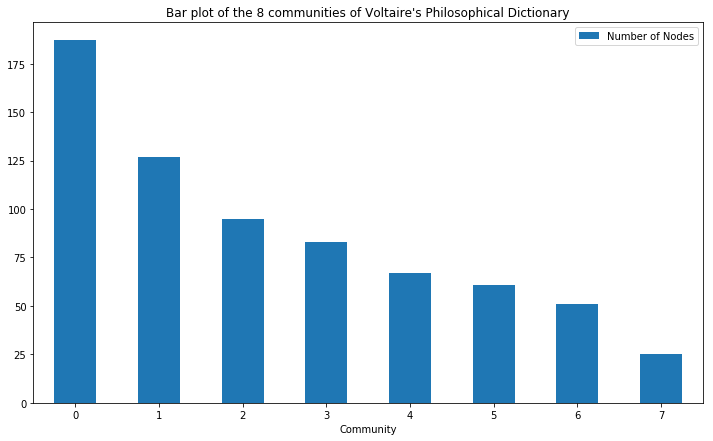

In [23]:
partition = community.best_partition(Gw)
# print partition

kk=len(set(partition.values()))
modularity=community.modularity(partition, Gw, weight='weight')
print 'The graph has', kk, 'communities and modularity coefficient equal to', modularity

cml=[]
for j in range(kk):
    cj=[]
    for k,v in partition.items():
        if v==j:
            cj.append(k)
    cml.append(cj)
cmd={}
for j in range(kk):
    cmd[tuple(cml[j])]=len(cml[j])
cmd
ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
commsd={}
louvain_comm_membership={}
for i in eocmd:
    print 'Community', i[0], 'with', i[1][1], 'nodes:', list(i[1][0])
    commsd[i[0]]=i[1][1] 
    ts=list(i[1][0])
    louvain_comm_membership[i[0]]=ts 
    

ddf=pd.DataFrame(commsd.items(), columns=['Community', 'Number of Nodes'])
sst="Bar plot of the %i communities of %s" %(kk,titlename)
ddf.plot.bar(x='Community', y='Number of Nodes', figsize=(12,7),rot=0,title=sst);

The graph has 9 communities and modularity coefficient equal to 0.51520365704
Community 0 with 63 nodes: ['Adimo', 'Cambyses', 'Laurette', 'Tasso', 'Houttevillus', 'Xerxes', 'Joab', 'Giovanni Galeas Sforza', 'Harvey', 'Frida', 'Antoninus', 'Ardassan Ougli', 'Zarathustra', 'Lent', 'Manes', 'Simon Barjona', 'Jupiter Ammon', 'Julian', 'Charron', 'Abbe Houtteville', 'Agricola', 'Amarilli', 'Ravaillac', 'Holophernes', 'Irminsul', 'Ronsard', 'Codrus', 'Marcus Aurelius', 'Euclid', 'Montaigne', 'Petronius', 'Judith', 'Hermes', 'Amyot', 'Adam', 'Anitus', 'Tacitus', 'Admiral Coligny', 'Epictetus', 'David', 'Clitus', 'Grotius', 'Domitian', 'St. James', 'Antonine', 'Pythagoras', 'Epiphanius', 'Eve,', 'St. Adhelme', 'Aniximanders', 'Amasa', 'Mohammed', 'St. Augustine', 'Lauder', 'Bolingbroke', 'Ahriman', 'Apis', 'Galileo', 'Kie', 'Digne', 'Abbe Pluche', 'Chu ', 'Torricelli']
Community 1 with 54 nodes: ['Cyrus', 'St. Cyprian', 'Socrates', 'Richeome', 'King Nicomedes', 'Mr. Holwell', 'Collins', 'Inac

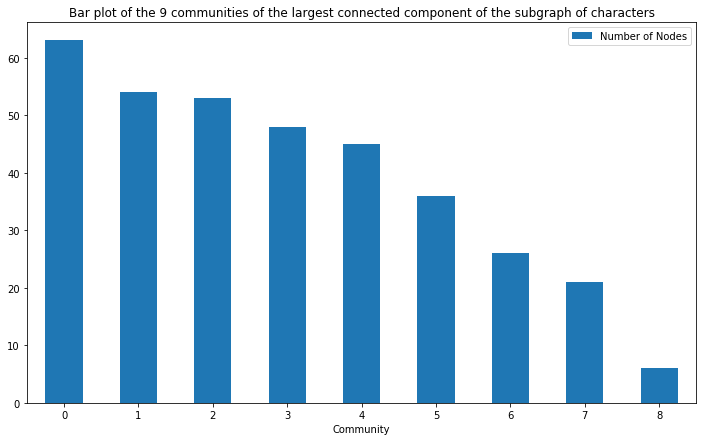

In [24]:
partition = community.best_partition(Gchl)
# print partition

kk=len(set(partition.values()))
modularity=community.modularity(partition, Gchl, weight='weight')
print 'The graph has', kk, 'communities and modularity coefficient equal to', modularity

cml=[]
for j in range(kk):
    cj=[]
    for k,v in partition.items():
        if v==j:
            cj.append(k)
    cml.append(cj)
cmd={}
for j in range(kk):
    cmd[tuple(cml[j])]=len(cml[j])
cmd
ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
commsd={}
louvain_comm_membership={}
for i in eocmd:
    print 'Community', i[0], 'with', i[1][1], 'nodes:', list(i[1][0])
    commsd[i[0]]=i[1][1] 
    ts=list(i[1][0])
    louvain_comm_membership[i[0]]=ts 
    
name="the largest connected component of the subgraph of characters"
ddf=pd.DataFrame(commsd.items(), columns=['Community', 'Number of Nodes'])
sst="Bar plot of the %i communities of %s" %(kk,name)
ddf.plot.bar(x='Community', y='Number of Nodes', figsize=(12,7),rot=0,title=sst);

The graph has 8 communities and modularity coefficient equal to 0.38670718557
Community 0 with 61 nodes: ['Paris', 'Lacedaemon', 'Pavia', 'Mequinez', 'Valentinois', 'Havana', 'Dodona', 'Rhodes', 'Rome', 'Birma', 'Basle', 'Mirandola', 'India', 'Jupiter', 'Chantilli', 'France', 'Peru', 'Red Sea', 'Medea', 'China', 'Indus', 'Tlascala', 'Tuscany', 'Rheims', 'Mount Krapack', 'Nankin', 'Benevento', 'Madrid', 'Pons', 'Mayence', 'Gibraltar', 'Vaugirard', 'Sparta', 'Blois', 'Climart', 'Adriatic Gulf', 'Eleusis', 'Aea', 'Canterbury', 'Thebes', 'Omer', 'Prosperine', 'Chaldea', 'Egypt', 'Lemnos', 'Barbados', 'Italy', 'Athens', 'port of Arsinoe', 'Tuscan', 'Poland', 'Saint-Denis', 'Nancy', 'Turkey', 'Hotel-de-Ville', 'Zug', 'Volga', 'Capitol', 'Mexico', 'Pico', 'Greece']
Community 1 with 59 nodes: ['Moon', 'Hull', 'York', 'Louvain', 'Alexandria', 'England', 'Cologne', 'Mecca', 'Paradise', 'Guienne', 'Norway', 'Babylon', 'Manchester', 'Arbela', 'Sweden', 'Loretto', 'Castel-Gandolfo', 'Lorette', 'Por

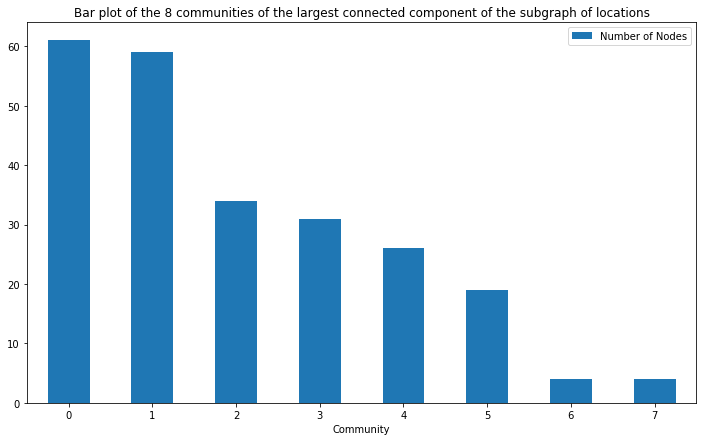

In [31]:
partition = community.best_partition(Glol)
# print partition

kk=len(set(partition.values()))
modularity=community.modularity(partition, Glol, weight='weight')
print 'The graph has', kk, 'communities and modularity coefficient equal to', modularity

cml=[]
for j in range(kk):
    cj=[]
    for k,v in partition.items():
        if v==j:
            cj.append(k)
    cml.append(cj)
cmd={}
for j in range(kk):
    cmd[tuple(cml[j])]=len(cml[j])
cmd
ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
commsd={}
louvain_comm_membership={}
for i in eocmd:
    print 'Community', i[0], 'with', i[1][1], 'nodes:', list(i[1][0])
    commsd[i[0]]=i[1][1] 
    ts=list(i[1][0])
    louvain_comm_membership[i[0]]=ts 
    
name="the largest connected component of the subgraph of locations"
ddf=pd.DataFrame(commsd.items(), columns=['Community', 'Number of Nodes'])
sst="Bar plot of the %i communities of %s" %(kk,name)
ddf.plot.bar(x='Community', y='Number of Nodes', figsize=(12,7),rot=0,title=sst);

The graph has 4 communities and modularity coefficient equal to 0.0413018657568
Community 0 with 32 nodes: ['love', 'astrology', 'false mind', 'master', 'emblem', 'fraud', 'necessary', 'tear', 'free-will', 'soul', 'truth', 'charlatan', 'friendship', 'art', 'library', 'theatre', 'mountain', 'destiny', 'theist', 'philosopher', 'luxury', 'animal', 'bankruptcy', 'beauty', 'nature', 'final causes', 'reason', 'why', 'contradiction', 'atheism', 'sect', 'virtue']
Community 1 with 21 nodes: ['civil law', 'iron mask', 'common sense', 'advocate', 'authority', 'kiss', 'equality', 'marriage', 'nakedness', 'adultery', 'prayer', 'democracy', 'fatherland', 'natural law', 'state', 'corn', 'ecclesiast', 'power', 'devout', 'tyranny', 'faith']
Community 2 with 18 nodes: ['liberty', 'character', 'custom', 'boulevart', 'omnipotence', 'history', 'men of letters', 'author', 'religion', 'book', 'expiation', 'precis', 'impious', 'law', 'extreme', 'rare', 'language', 'bishop']
Community 3 with 13 nodes: ['antiqu

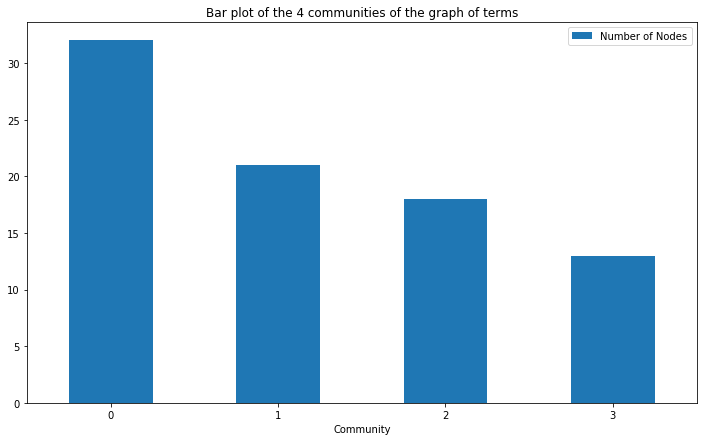

In [42]:
partition = community.best_partition(Gte)
# print partition

kk=len(set(partition.values()))
modularity=community.modularity(partition, Gte, weight='weight')
print 'The graph has', kk, 'communities and modularity coefficient equal to', modularity

cml=[]
for j in range(kk):
    cj=[]
    for k,v in partition.items():
        if v==j:
            cj.append(k)
    cml.append(cj)
cmd={}
for j in range(kk):
    cmd[tuple(cml[j])]=len(cml[j])
cmd
ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
commsd={}
louvain_comm_membership={}
for i in eocmd:
    print 'Community', i[0], 'with', i[1][1], 'nodes:', list(i[1][0])
    commsd[i[0]]=i[1][1] 
    ts=list(i[1][0])
    louvain_comm_membership[i[0]]=ts 
    
name="the graph of terms"
ddf=pd.DataFrame(commsd.items(), columns=['Community', 'Number of Nodes'])
sst="Bar plot of the %i communities of %s" %(kk,name)
ddf.plot.bar(x='Community', y='Number of Nodes', figsize=(12,7),rot=0,title=sst);

In [80]:
# Copy, paste and run cell 5 here:
# BELOW YOU NEED TO HOLD ONLY AS MANY COMMUNITIES AS YOU HAVE FOUND IN THE PREVIOUS CELL.
# POSSIBLY YOU MIGHT NEED TO UPDATE (COMMENT OUT OR ADD IN) COMMANDS AS "if p== ...", "G5 = ...", "pos5= ...", "For 5 communities ..."

pos0=nx.circular_layout(nx.cycle_graph(kk)) #kk=4 is the number communities

ocmd=sorted(cmd.iteritems(), key=operator.itemgetter(1), reverse=True)
eocmd=enumerate(ocmd)
for p,q in list(eocmd):
    if p==0:
        c1=list(list(q)[0])
    if p==1:
        c2=list(list(q)[0])
    if p==2:
        c3=list(list(q)[0])
    if p==3:
        c4=list(list(q)[0])
#     if p==4:
#         c5=list(list(q)[0])
#     if p==5:
#         c6=list(list(q)[0])
#     if p==6:
#         c7=list(list(q)[0])
#     if p==7:
#         c8=list(list(q)[0])
#     if p==8:
#         c9=list(list(q)[0])

G1=Gte.subgraph(c1)
pos1=nx.circular_layout(G1) 

G2=Gte.subgraph(c2)
pos2=nx.circular_layout(G2) 

G3=Gte.subgraph(c3)
pos3=nx.circular_layout(G3) 

G4=Gte.subgraph(c4)
pos4=nx.circular_layout(G4) 

# G5=Gte.subgraph(c5)
# pos5=nx.circular_layout(G5)

# G6=G.subgraph(c6)
# pos6=nx.circular_layout(G6) 

# G7=G.subgraph(c7)
# pos7=nx.circular_layout(G7) 

# G8=G.subgraph(c8)
# pos8=nx.circular_layout(G8)

# G9=G.subgraph(c9)
# pos9=nx.circular_layout(G9)

def re_pos(pos,centre,radius):
    plist=[list(v) for v in pos.values()]
    nplist=[v for v in pos.values()]
    x = [p[0] for p in plist]
    y = [p[1] for p in plist]
    centroid = (sum(x) / float(len(plist)), sum(y) / float(len(plist)))
    ncentroid=np.array(centroid)
    rad=max([np.linalg.norm(nplist[i]-ncentroid) for i in range(len(nplist))])
    rpos={}
    for k,v in pos.items():
        rpos[k]=[(v[0]+centre[0])/float(radius),(v[1]+centre[1])/float(radius)]
    return rpos

centers=pos0.values()
centerm=[]
for i in range(len(centers)):
    t=[]
    for j in centers[i]:
        t.append(3*j)  
    centerm.append(np.array(t))
centers=centerm

radius=2. #1.5
pos1=re_pos(pos1,centers[0],0.8)  
pos2=re_pos(pos2,centers[1],1.3)    
pos3=re_pos(pos3,centers[2],1.3) 
pos4=re_pos(pos4,centers[3],1.5)
# pos5=re_pos(pos5,centers[4],radius)
# pos6=re_pos(pos6,centers[5],radius) 
# pos7=re_pos(pos7,centers[6],radius)
# pos8=re_pos(pos8,centers[7],radius)
# pos9=re_pos(pos9,centers[8],radius)

pos1['philosopher']= [3.7499999084132623, 1.55] #[3.7499999084132623, 1.250000063177385]
pos1['free-will']= [3.749999977958598, -1.5] #[3.749999977958598, -1.249999906399617]
pos1['soul']= [3.9938629764518385, -1.3] #[3.9938629764518385, -1.2259814700215987]
pos1['tear']= [3.506136986906059, -1.4] #[3.506136986906059, -1.2259814700215987]
pos1['false mind']= [3.5061370614118634, 1.4]  #[3.993862901946033, 1.225981626799367]
pos1['master']= [4.1, 1.35]#[3.749999977958598, -1.249999906399617]

pos2['devout']=[0.05748475718466599, 1.25]#[0.05748475718466599, 1.5406124913328942]
pos2['iron mask']= [0.05748462536670153, 3.3]#[0.05748462536670153, 3.0747721338766625]
pos2['nakedness']= [-0.17117004244952255, 3.2]# [-1.1608189227865429e-07, 3.0769230769230766]
pos2['kiss']= [0.281031484609518, 1.5]#[0.281031484609518, 1.5916355803197137]
pos2['marriage']=[-0.17117008829924932, 1.4]#[-0.17117008829924932, 1.557747772168183]

pos3['author']= [-2.1741166725495713, 0.95]#[-2.1741166725495713, 0.7575442658201438]
pos3['bishop']=  [-2.4412677581625437, 0.85]# [-2.4412677581625437, 0.7575442658201438]
pos3['omnipotence']= [-1.923076871177584, 0.75]#[-1.923076871177584, 0.6661732811991565]
pos3['impious']= [-2.1741167298617285, -1]# [-2.1741167298617285, -0.7575445253045107]
pos3['expiation']= [-2.4412677123128175, -0.9]# [-2.4412677123128175, -0.7575445711542366]

pos4['tolerance']=[0.08035788560198975, -2.8]#[0.08035788560198975, -2.6618058037846115]
pos4['god']=[0.080357845865561, -1.2]#[0.080357845865561, -1.3381940244264872]
    
    
# For 2 communities
# posAll=dict(pos1.items()+pos2.items()+[(k,pos1[k]+pos2[k]) for k in set(pos2)&set(pos1)])

# For 3 communities
# posAll=dict(pos1.items()+pos2.items()+pos3.items()+[(k,pos1[k]+pos2[k]+pos3[k]) for k in set(pos3)&set(pos2)&set(pos1)])

# For 4 communities
posAll=dict(pos1.items()+pos2.items()+pos3.items()+pos4.items()+[(k,pos1[k]+pos2[k]+pos3[k]+pos4[k]) for k in set(pos4)&set(pos3)&set(pos2)&set(pos1)])

# For 5 communities
# posAll=dict(pos1.items()+pos2.items()+pos3.items()+pos4.items()+pos5.items()+[(k,pos1[k]+pos2[k]+pos3[k]+pos4[k]+pos5[k]) for k in set(pos5)&set(pos4)&set(pos3)&set(pos2)&set(pos1)])

# For 9 communities
# posAll=dict(pos1.items()+pos2.items()+pos3.items()+pos4.items()+pos5.items()+pos6.items()+pos7.items()+pos8.items()+pos9.items()+[(k,pos1[k]+pos2[k]+pos3[k]+pos4[k]+pos5[k]+pos6[k]+pos7[k]+pos8[k]+pos9[k]) for k in set(pos9)&set(pos8)&set(pos7)&set(pos6)&set(pos5)&set(pos4)&set(pos3)&set(pos2)&set(pos1)])

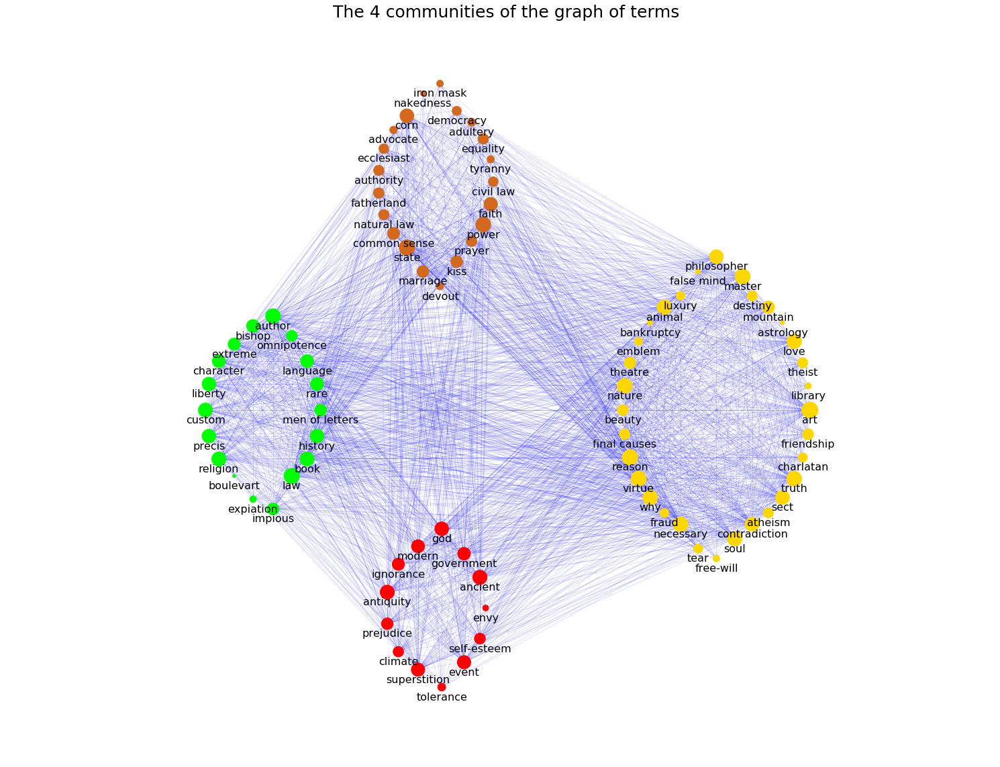

In [81]:
# Copy, paste and run cell 6 here:
# BELOW YOU NEED TO HOLD ONLY AS MANY COMMUNITIES AS YOU HAVE FOUND PREVIOUSLY.
# POSSIBLY YOU MIGHT NEED TO UPDATE (COMMENT OUT OR ADD IN) COMMANDS AS "nsi5 = ...", "nx.draw_networkx_nodes(G5, ..."
# YOU SHOULD ALSO UNTANGLE OVERLAPPING LABELS OR CHANGE THE LAYOUT OR EVEN CHANGE "radious" IN THE CELL ABOVE

plt.figure(figsize=(26,20))

nsi1=[7*Gte.degree(n) for n in c1] 
nsi2=[7*Gte.degree(n) for n in c2]
nsi3=[7*Gte.degree(n) for n in c3]
nsi4=[7*Gte.degree(n) for n in c4]
# nsi5=[100*Gte.degree(n) for n in c5]
# nsi6=[100*G.degree(n) for n in c6]
# nsi7=[100*G.degree(n) for n in c7]
# nsi8=[100*G.degree(n) for n in c8]
# nsi9=[100*G.degree(n) for n in c9]

nx.draw_networkx_nodes(G1,pos=pos1,node_size=nsi1,nodelist=c1,node_color='gold',alpha=1.);
nx.draw_networkx_nodes(G2,pos=pos2,node_size=nsi2,nodelist=c2,node_color='chocolate',alpha=1.);
nx.draw_networkx_nodes(G3,pos=pos3,node_size=nsi3,nodelist=c3,node_color='lime',alpha=1.);
nx.draw_networkx_nodes(G4,pos=pos4,node_size=nsi4,nodelist=c4,node_color='red',alpha=1.);
# nx.draw_networkx_nodes(G5,pos=pos5,node_size=nsi5,nodelist=c5,node_color='cyan',alpha=1.);
# nx.draw_networkx_nodes(G6,pos=pos6,node_size=nsi6,nodelist=c6,node_color='green',alpha=1.);
# nx.draw_networkx_nodes(G7,pos=pos7,node_size=nsi7,nodelist=c7,node_color='aqua',alpha=1.);
# nx.draw_networkx_nodes(G8,pos=pos8,node_size=nsi8,nodelist=c8,node_color='magenta',alpha=1.);
# nx.draw_networkx_nodes(G9,pos=pos9,node_size=nsi9,nodelist=c9,node_color='orchid',alpha=1.);

edge_width=0.6
nx.draw_networkx_edges(Gte, posAll, edge_color='b',width=edge_width,alpha=0.2)
# nx.draw_networkx_labels(CGwi,posAll,labels=labels,font_size=13); 

# nx.draw_networkx_edges(G,pos=pos,edge_color='b',width=edgewidth,alpha=0.2);
# nx.draw_networkx_labels(G,pos=pos,labels=labels,font_size=25);

plt.axis('off');
yoffset = {}
y_off = -0.1 # offset on the y axis
for k, v in posAll.items():
    yoffset[k] = (v[0], v[1]+y_off)
nx.draw_networkx_labels(Gte, yoffset, font_size=16);
sst="The %i communities of %s" %(kk,name)
plt.title(sst,fontsize=25);
plt.margins(x=0.3, y=0.1) 

## 4. Centralities of Nodes of the Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items

In [6]:
def create_centralities_list(G,maxiter=2000,pphi=5,centList=[]):
    if len(centList)==0:
        centList=['degree','closeness','betweenness','eigenvector','Katz','PageRank','HITS','load','communicability','current flow']
    cenLen=len(centList)
    valus={}
    for uu,centr in enumerate(centList):
        if centr=='degree':
            if isinstance(G,nx.DiGraph):
                cent=nx.in_degree_centrality(G)
                sstt='In Degree Centralities '
                valus['in_degree']=cent
                cent=nx.out_degree_centrality(G)
                sstt+= 'and Out Degree Centralities'
                valus['out_degree']=cent
            else:
                cent=nx.degree_centrality(G)
                sstt='Degree Centralities'
                ssttt='degree centrality'
                valus[centr]=cent
        elif centr=='closeness':
            cent=nx.closeness_centrality(G)
            sstt='Closeness Centralities'
            ssttt='closeness centrality'
            valus[centr]=cent
        elif centr =='load':
            cent=nx.load_centrality(G)
            sstt='Load Centraities'
            valus[centr]=cent
        elif centr == 'communicability':
            if not isinstance(G, nx.DiGraph):
                cent=nx.communicability_betweenness_centrality(G)
                sstt='Communicability Centralities'
                valus[centr]=cent
        elif centr=='betweenness':
            cent=nx.betweenness_centrality(G)
            sstt='Betweenness Centralities'
            ssttt='betweenness centrality'
            valus[centr]=cent
        elif centr=='current flow':
            if not isinstance(G, nx.DiGraph):
            
                cent=nx.current_flow_closeness_centrality(G)
                sstt='Current Flow Closeness Centrality'
                valus[centr]=cent
        elif centr=='eigenvector':
            try:
                cent=nx.eigenvector_centrality(G,max_iter=maxiter)
                sstt='Eigenvector Centralities'
                ssttt='eigenvector centrality'
                valus[centr]=cent

            except:
                valus[centr]=None

                continue
        elif centr=='Katz':
            phi = (1+math.sqrt(pphi))/2.0 # largest eigenvalue of adj matrix
            cent=nx.katz_centrality_numpy(G,1/phi-0.01)
            cent=nx.katz_centrality_numpy(G,.05)#,1/phi-0.01)
            
            sstt='Katz Centralities'
            ssttt='Katz centrality'
            valus[centr]=cent
#             valus[centr+'_%i' %pphi]=cent

        elif centr=='PageRank':
            try:
                cent=nx.pagerank(G)
                sstt='PageRank'
                ssttt='pagerank'
                valus[centr]=cent

            except:
                valus[centr]=None

                continue
        elif centr=='HITS':
            if isinstance(G,nx.DiGraph):
                dd=nx.hits(G,max_iter=maxiter)
                sstt='HITS hubs '
                valus['HITS_hubs']=dd[0]
                sstt+= 'and HITS authorities'
                valus['HITS_auths']=dd[1]
            else:
                dd=nx.hits(G,max_iter=maxiter)
                cent=nx.degree_centrality(G)
                sstt='HITS'
                ssttt='HITS Centralities'
                valus[centr]=dd[0]
        else:
            continue
#         print '%s done!!!' %sstt
    return valus

dindices=['out_degree','in_degree','closeness','betweenness','eigenvector','HITS_hubs','HITS_auths','Katz','PageRank','load']
indices=['degree','closeness','betweenness','eigenvector','HITS','Katz','PageRank','load','communicability','current flow']
# indices=['degree','closeness','betweenness','eigenvector']

# Without 'communicability' and 'current flow' (undirected case)
dindicesd=['out_degree','in_degree','closeness','betweenness','eigenvector','HITS_hubs','HITS_auths','Katz','PageRank','load']
indicesd=['degree','closeness','betweenness','eigenvector','HITS','Katz','PageRank','load']
# indicesd=['degree','closeness','betweenness','eigenvector']

dindicesdr=dindices
indicesdr=indices

# Plus 'node'
dindicesdrn=["node"]+dindices
indicesdrn=['node']+indices

def central_df(G,node,central_pd):
    central_pd[node]=central_pd.index.values
    if isinstance(G,nx.DiGraph):
        central_pd=central_pd[[node]+dindices]
    else:
        central_pd=central_pd[[node]+indices]
    central_pd[node]=central_pd.index.values
    central_pd.reset_index(drop = True, inplace = True)
    # central_pd=central_pd[['node']]
    central_pd.sort_values(node) #.head()
    # central_pd['node']=G.nodes()
    return central_pd

In [8]:
central_pd=pd.DataFrame(create_centralities_list(Gw))
node="node"
cdf=central_df(Gw,node,central_pd)
cdf.sort_values(by=['degree'],ascending=False)

,node,degree,closeness,betweenness,eigenvector,HITS,Katz,PageRank,load,communicability,current flow
615,art,0.966906,0.967967,0.145603,0.145536,0.025738,0.147686,0.024012,0.145613,0.949321,0.047113
659,law,0.715108,0.778275,0.045215,0.128958,0.018340,-0.044801,0.015360,0.045175,0.899987,0.046277
681,reason,0.660432,0.746509,0.036984,0.121185,0.017660,-0.001443,0.013959,0.036975,0.868142,0.046021
686,state,0.631655,0.730810,0.027973,0.121548,0.013835,-0.044746,0.011725,0.027967,0.868996,0.045867
692,truth,0.598561,0.713552,0.024698,0.118936,0.014470,0.034745,0.011559,0.024693,0.856798,0.045680
268,France,0.579856,0.704154,0.022785,0.113796,0.011563,-0.112387,0.010307,0.022780,0.830858,0.045564
672,necessary,0.568345,0.698492,0.019412,0.115977,0.013600,-0.054859,0.010658,0.019408,0.841739,0.045490
612,ancient,0.568345,0.698492,0.021677,0.114914,0.012473,-0.040055,0.010436,0.021670,0.836499,0.045488
618,author,0.555396,0.692231,0.022490,0.107961,0.011261,0.039274,0.009768,0.022488,0.797895,0.045404
245,England,0.553957,0.691542,0.021443,0.110792,0.008402,-0.057466,0.008221,0.021439,0.814197,0.045392


In [16]:
# node0="St. Bruno" #nature" 
node0=random.choice(list(Gw.nodes()))
print node0

node="node"
df=central_df(Gw,node,central_pd)
df.loc[df['node'] == node0]

Adonis


,node,degree,closeness,betweenness,eigenvector,HITS,Katz,PageRank,load,communicability,current flow
14,Adonis,0.034532,0.508413,0.0,0.012336,0.000386,0.020775,0.000493,0.0,0.02043,0.020137


In [17]:
t=[]
s = 0
for node1 in Gw.nodes():
    if node1!=node0:
        try:
            ii = nx.dijkstra_path(Gw,node0,node1)
            nnd=[(ii[i],ii[i+1]) for i in range(len(ii)-1)]
        except NetworkXNoPath,e:
            ii=[]
            nnd=[]
        if not len(ii) ==0:
            print "The path from '%s' to '%s' is:" %(node0,node1)
            print ii
            print "The distance between '%s' and '%s' is %i" %(node0,node1,len(ii)-1)
            t.append(len(ii)-1)
            s+=1
            print

t=sorted(set(t))


The path from 'Adonis' to 'Azem' is:
['Adonis', 'art', 'Azem']
The distance between 'Adonis' and 'Azem' is 2

The path from 'Adonis' to 'Ireton' is:
['Adonis', 'ancient', 'Ireton']
The distance between 'Adonis' and 'Ireton' is 2

The path from 'Adonis' to 'Moon' is:
['Adonis', 'art', 'Moon']
The distance between 'Adonis' and 'Moon' is 2

The path from 'Adonis' to 'Caesar' is:
['Adonis', 'Mohammed', 'Caesar']
The distance between 'Adonis' and 'Caesar' is 2

The path from 'Adonis' to 'Moses' is:
['Adonis', 'Ceres', 'Moses']
The distance between 'Adonis' and 'Moses' is 2

The path from 'Adonis' to 'St. Cyprian' is:
['Adonis', 'art', 'St. Cyprian']
The distance between 'Adonis' and 'St. Cyprian' is 2

The path from 'Adonis' to 'Jupiter Ammon' is:
['Adonis', 'art', 'Jupiter Ammon']
The distance between 'Adonis' and 'Jupiter Ammon' is 2

The path from 'Adonis' to 'Lais' is:
['Adonis', 'art', 'Lais']
The distance between 'Adonis' and 'Lais' is 2

The path from 'Adonis' to 'Yvon' is:
['Adonis'

The path from 'Adonis' to 'Clark' is:
['Adonis', 'art', 'Clark']
The distance between 'Adonis' and 'Clark' is 2

The path from 'Adonis' to 'Duke of Valentinois' is:
['Adonis', 'art', 'Duke of Valentinois']
The distance between 'Adonis' and 'Duke of Valentinois' is 2

The path from 'Adonis' to 'Pierre Cauchon' is:
['Adonis', 'art', 'Pierre Cauchon']
The distance between 'Adonis' and 'Pierre Cauchon' is 2

The path from 'Adonis' to 'Queen' is:
['Adonis', 'love', 'Queen']
The distance between 'Adonis' and 'Queen' is 2

The path from 'Adonis' to 'contradiction' is:
['Adonis', 'Ceres', 'contradiction']
The distance between 'Adonis' and 'contradiction' is 2

The path from 'Adonis' to 'precis' is:
['Adonis', 'Ceres', 'precis']
The distance between 'Adonis' and 'precis' is 2

The path from 'Adonis' to 'Antonine' is:
['Adonis', 'ancient', 'Antonine']
The distance between 'Adonis' and 'Antonine' is 2

The path from 'Adonis' to 'Arabia' is:
['Adonis', 'ancient', 'Arabia']
The distance between 'Ad

The path from 'Adonis' to 'Swiss' is:
['Adonis', 'reason', 'Swiss']
The distance between 'Adonis' and 'Swiss' is 2

The path from 'Adonis' to 'Syria' is:
['Adonis', 'Latium', 'Syria']
The distance between 'Adonis' and 'Syria' is 2

The path from 'Adonis' to 'Louvois' is:
['Adonis', 'art', 'Louvois']
The distance between 'Adonis' and 'Louvois' is 2

The path from 'Adonis' to 'law' is:
['Adonis', 'Rol', 'law']
The distance between 'Adonis' and 'law' is 2

The path from 'Adonis' to 'Ceres' is:
['Adonis', 'Ceres']
The distance between 'Adonis' and 'Ceres' is 1

The path from 'Adonis' to 'Belgrade' is:
['Adonis', 'art', 'Belgrade']
The distance between 'Adonis' and 'Belgrade' is 2

The path from 'Adonis' to 'Mexico' is:
['Adonis', 'art', 'Mexico']
The distance between 'Adonis' and 'Mexico' is 2

The path from 'Adonis' to 'Ottoman' is:
['Adonis', 'art', 'Ottoman']
The distance between 'Adonis' and 'Ottoman' is 2

The path from 'Adonis' to 'Thebes' is:
['Adonis', 'art', 'Thebes']
The distance

The path from 'Adonis' to 'Berriat Saint-Prix' is:
['Adonis', 'art', 'Berriat Saint-Prix']
The distance between 'Adonis' and 'Berriat Saint-Prix' is 2

The path from 'Adonis' to 'Eusebius' is:
['Adonis', 'art', 'Eusebius']
The distance between 'Adonis' and 'Eusebius' is 2

The path from 'Adonis' to 'Elizabeth' is:
['Adonis', 'art', 'Elizabeth']
The distance between 'Adonis' and 'Elizabeth' is 2

The path from 'Adonis' to 'Duc d'Orleans' is:
['Adonis', 'art', "Duc d'Orleans"]
The distance between 'Adonis' and 'Duc d'Orleans' is 2

The path from 'Adonis' to 'Pernelle' is:
['Adonis', 'art', 'Pernelle']
The distance between 'Adonis' and 'Pernelle' is 2

The path from 'Adonis' to 'Admiral Coligny' is:
['Adonis', 'art', 'Admiral Coligny']
The distance between 'Adonis' and 'Admiral Coligny' is 2

The path from 'Adonis' to 'god' is:
['Adonis', 'god']
The distance between 'Adonis' and 'god' is 1

The path from 'Adonis' to 'Queen Anne' is:
['Adonis', 'god', 'Queen Anne']
The distance between 'Ad

The path from 'Adonis' to 'Ixion' is:
['Adonis', 'art', 'Ixion']
The distance between 'Adonis' and 'Ixion' is 2

The path from 'Adonis' to 'Cataline' is:
['Adonis', 'art', 'Cataline']
The distance between 'Adonis' and 'Cataline' is 2

The path from 'Adonis' to 'Corneille' is:
['Adonis', 'necessary', 'Corneille']
The distance between 'Adonis' and 'Corneille' is 2

The path from 'Adonis' to 'Amasa' is:
['Adonis', 'art', 'Amasa']
The distance between 'Adonis' and 'Amasa' is 2

The path from 'Adonis' to 'marriage' is:
['Adonis', 'love', 'marriage']
The distance between 'Adonis' and 'marriage' is 2

The path from 'Adonis' to 'Albrecht Durer' is:
['Adonis', 'art', 'Albrecht Durer']
The distance between 'Adonis' and 'Albrecht Durer' is 2

The path from 'Adonis' to 'Catalonia' is:
['Adonis', 'art', 'Catalonia']
The distance between 'Adonis' and 'Catalonia' is 2

The path from 'Adonis' to 'Shakespeare' is:
['Adonis', 'religion', 'Shakespeare']
The distance between 'Adonis' and 'Shakespeare' is 

The path from 'Adonis' to 'York' is:
['Adonis', 'art', 'York']
The distance between 'Adonis' and 'York' is 2

The path from 'Adonis' to 'Jacob' is:
['Adonis', 'art', 'Jacob']
The distance between 'Adonis' and 'Jacob' is 2

The path from 'Adonis' to 'Epicurus' is:
['Adonis', 'religion', 'Epicurus']
The distance between 'Adonis' and 'Epicurus' is 2

The path from 'Adonis' to 'Father Griffet' is:
['Adonis', 'art', 'Father Griffet']
The distance between 'Adonis' and 'Father Griffet' is 2

The path from 'Adonis' to 'Valentinois' is:
['Adonis', 'art', 'Valentinois']
The distance between 'Adonis' and 'Valentinois' is 2

The path from 'Adonis' to 'Homer' is:
['Adonis', 'necessary', 'Homer']
The distance between 'Adonis' and 'Homer' is 2

The path from 'Adonis' to 'Bedford' is:
['Adonis', 'art', 'Bedford']
The distance between 'Adonis' and 'Bedford' is 2

The path from 'Adonis' to 'Havana' is:
['Adonis', 'art', 'Havana']
The distance between 'Adonis' and 'Havana' is 2

The path from 'Adonis' to

The path from 'Adonis' to 'Jason' is:
['Adonis', 'art', 'Jason']
The distance between 'Adonis' and 'Jason' is 2

The path from 'Adonis' to 'Demiourgos' is:
['Adonis', 'art', 'Demiourgos']
The distance between 'Adonis' and 'Demiourgos' is 2

The path from 'Adonis' to 'Indies' is:
['Adonis', 'art', 'Indies']
The distance between 'Adonis' and 'Indies' is 2

The path from 'Adonis' to 'Compostella' is:
['Adonis', 'art', 'Compostella']
The distance between 'Adonis' and 'Compostella' is 2

The path from 'Adonis' to 'Sherlock' is:
['Adonis', 'art', 'Sherlock']
The distance between 'Adonis' and 'Sherlock' is 2

The path from 'Adonis' to 'Villaret' is:
['Adonis', 'art', 'Villaret']
The distance between 'Adonis' and 'Villaret' is 2

The path from 'Adonis' to 'Demosthenes' is:
['Adonis', 'necessary', 'Demosthenes']
The distance between 'Adonis' and 'Demosthenes' is 2

The path from 'Adonis' to 'Colonne' is:
['Adonis', 'art', 'Colonne']
The distance between 'Adonis' and 'Colonne' is 2

The path fro

The path from 'Adonis' to 'Amarilli' is:
['Adonis', 'art', 'Amarilli']
The distance between 'Adonis' and 'Amarilli' is 2

The path from 'Adonis' to 'Cecrops' is:
['Adonis', 'art', 'Cecrops']
The distance between 'Adonis' and 'Cecrops' is 2

The path from 'Adonis' to 'St. Leo' is:
['Adonis', 'art', 'St. Leo']
The distance between 'Adonis' and 'St. Leo' is 2

The path from 'Adonis' to 'Candia' is:
['Adonis', 'art', 'Candia']
The distance between 'Adonis' and 'Candia' is 2

The path from 'Adonis' to 'Tours' is:
['Adonis', 'art', 'Tours']
The distance between 'Adonis' and 'Tours' is 2

The path from 'Adonis' to 'impious' is:
['Adonis', 'ancient', 'impious']
The distance between 'Adonis' and 'impious' is 2

The path from 'Adonis' to 'Charles IX.' is:
['Adonis', 'art', 'Charles IX.']
The distance between 'Adonis' and 'Charles IX.' is 2

The path from 'Adonis' to 'Aphrodite' is:
['Adonis', 'art', 'Aphrodite']
The distance between 'Adonis' and 'Aphrodite' is 2

The path from 'Adonis' to 'Balaa

The path from 'Adonis' to 'Vendome' is:
['Adonis', 'art', 'Vendome']
The distance between 'Adonis' and 'Vendome' is 2

The path from 'Adonis' to 'Arachne' is:
['Adonis', 'art', 'Arachne']
The distance between 'Adonis' and 'Arachne' is 2

The path from 'Adonis' to 'Ireland' is:
['Adonis', 'Mohammed', 'Ireland']
The distance between 'Adonis' and 'Ireland' is 2

The path from 'Adonis' to 'Clodovic' is:
['Adonis', 'art', 'Clodovic']
The distance between 'Adonis' and 'Clodovic' is 2

The path from 'Adonis' to 'authority' is:
['Adonis', 'love', 'authority']
The distance between 'Adonis' and 'authority' is 2

The path from 'Adonis' to 'Emperor Yventi' is:
['Adonis', 'art', 'Emperor Yventi']
The distance between 'Adonis' and 'Emperor Yventi' is 2

The path from 'Adonis' to 'Leibnitz' is:
['Adonis', 'art', 'Leibnitz']
The distance between 'Adonis' and 'Leibnitz' is 2

The path from 'Adonis' to 'Origen' is:
['Adonis', 'ancient', 'Origen']
The distance between 'Adonis' and 'Origen' is 2

The path

The path from 'Adonis' to 'Bacchus' is:
['Adonis', 'art', 'Bacchus']
The distance between 'Adonis' and 'Bacchus' is 2

The path from 'Adonis' to 'Monseigneur' is:
['Adonis', 'art', 'Monseigneur']
The distance between 'Adonis' and 'Monseigneur' is 2

The path from 'Adonis' to 'Polignac' is:
['Adonis', 'art', 'Polignac']
The distance between 'Adonis' and 'Polignac' is 2

The path from 'Adonis' to 'library' is:
['Adonis', 'nature', 'library']
The distance between 'Adonis' and 'library' is 2

The path from 'Adonis' to 'Charles II.' is:
['Adonis', 'god', 'Charles II.']
The distance between 'Adonis' and 'Charles II.' is 2

The path from 'Adonis' to 'Switzerland' is:
['Adonis', 'love', 'Switzerland']
The distance between 'Adonis' and 'Switzerland' is 2

The path from 'Adonis' to 'Jean' is:
['Adonis', 'ancient', 'Jean']
The distance between 'Adonis' and 'Jean' is 2

The path from 'Adonis' to 'Peris' is:
['Adonis', 'art', 'Peris']
The distance between 'Adonis' and 'Peris' is 2

The path from 'A

In [18]:
print s
print "minimum distance from %s ="%(node0), min(t)
print "maximum distance from %s ="%(node0), max(t)

695
minimum distance from Adonis = 1
maximum distance from Adonis = 3


In [88]:
d=nx.diameter(Gw)
print "The diameter of the Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items of %s is %d"%(titlename,d)

The diameter of the Graph of Co-Occurring Dictionary Terms, Names of Persons and Names of Locations in Dictionary Items of Voltaire's Philosophical Dictionary is 3


In [89]:

for node1 in list(Gw.nodes())[:50]:
    for node2 in list(Gw.nodes())[:50]:
        try:
            ii = nx.dijkstra_path(G,node1,node2)
            nnd=[(ii[i],ii[i+1]) for i in range(len(ii)-1)]
        except NetworkXNoPath,e:
            print e
            ii=[]
            nnd=[]
        if len(ii)-1==d:
            print "The directed path from '%s' to '%s' is:" %(node1,node2)
            print ii
            print "The distance between '%s' and '%s' is %i" %(node1,node2,len(ii)-1)
            print

The directed path from 'Hannibal' to 'Aga of the Janissaries' is:
['Hannibal', 'Africa', 'ignorance', 'Aga of the Janissaries']
The distance between 'Hannibal' and 'Aga of the Janissaries' is 3

The directed path from 'Hannibal' to 'Collins' is:
['Hannibal', 'Africa', 'philosopher', 'Collins']
The distance between 'Hannibal' and 'Collins' is 3

The directed path from 'Cethegus' to 'Aga of the Janissaries' is:
['Cethegus', 'art', 'love', 'Aga of the Janissaries']
The distance between 'Cethegus' and 'Aga of the Janissaries' is 3

The directed path from 'Noah' to 'Aga of the Janissaries' is:
['Noah', 'art', 'love', 'Aga of the Janissaries']
The distance between 'Noah' and 'Aga of the Janissaries' is 3

The directed path from 'Sydenham' to 'Aga of the Janissaries' is:
['Sydenham', 'art', 'love', 'Aga of the Janissaries']
The distance between 'Sydenham' and 'Aga of the Janissaries' is 3

The directed path from 'free-will' to 'Paradise' is:
['free-will', 'love', 'Charles I.', 'Paradise']
The